<a href="https://colab.research.google.com/github/lbattioni/DS_coder_house/blob/main/ProyectoDS_parteI_Battioni.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyecto DS parte 1.
###  **Alumno**: Luciano Battioni
---
## Abstract

Las enfermedades cardiovasculares son la principal causa de muerte a nivel mundial. Dentro de estas la enfermedad coronaria (EC) es la más frecuente.Su importancia global a llevado a investigadores del siglo XX ha desarrollar numerosos modelos predictores de eventos cardiovasculares (infarto agudo de miocardio, accidente cerebrovacular, muerte de causa vascular), tanto para la población general como para poblaciones particularmente vulnerables (pacientes diabéticos, pacientes con enfermedad renal crónica, etc.) con la esperanza de poder intervenir terapeúticamente y poder prevenirlos. Sin embargo, su validez externa y generalizabilidad han demostrado tener importantes limitaciones. Esto se ha debido, entre otras causas, a que se derivaron de cohortes de bajo número de pacientes, poco representativas de determinadas etnias o se construyeron pensando en la factibilidad de ser usados en consultorio por lo que solo utilizan variables seleccionadas, comprometiendo, tal vez, parte su precisión.

Las tecnicas de *Machine learning* (ML) procesan gran cantidad de variables sin necesidad de intervención de un clínico. Esto haría factible la implementación de modelos más precisos, dezplegables en ámbitos como EHR (*Electronic Health Records*) que permitan la estimación de riesgo cardiovascular en base a la información proporcionada por el sistema de manera automática.



Para el primer entregable trabajaremos e intentaremos comprobar las siguientes hipótesis:

1. Relacionar los factores de riesgo cardiovacular con la cantidad de hs de ejercicio y sedentarismo. Entendiendo que es más probable que los pacientes con mayores factores de riesgo son los más sedentarios.
1. Relacionar los niveles de tensión arterial sistólica y diastólica con los niveles de Stress
1. Relacionar país, región con la dieta. Entendiendo que la idiosincracia local afecta hábitos alimenticios.

Estas hipótesis serán contestadas con técnicas de EDA

La hipótesis para el trabajo final es que se puede generar un modelo de ML que permita predecir el evento de infarto agudo de miocardio.

Para el presente análisis se utilizará una base sintética obtenida de la página kaggel. Las bases de datos con datos biomédios gozan de protecciones y regulaciones particulares, por lo tanto, la obtenciónd de un dataset público es dificultoso. La elección de esta base sintética se base en eso y en el hecho que apunta a la temática de la salud cardiovacular y es útil para ejercitar técnias de machine learning.
Fuente de la base sintética [link](https://www.kaggle.com/datasets/iamsouravbanerjee/heart-attack-prediction-dataset)

Este estudio es relevante para trabajadores de la salud, ya que se podrá demostrar que las técnicas de ML tiene al menos la misma capacidad de predicción que los scores clínicos tradicionales.

## Glosario de variables


Variable  | Descripción
-------------------|------------------
1.	Patient ID| texto, identificador del caso
2.	Age| numérica edad del paciente
3.	Sex| dicotómica (Male/Female)
4.	Cholesterol| numérica, nivel de colesterol en mg/dl
5.	Blood Pressure| texto, contiene tanto diastólica como sistólica separadas por barra invertida.
6.	Heart Rate| numérica, frecuencia cardíaca
7.	Diabetes| dicotómica, si el paciente tiene diabetes
8.	Family History| dicotómica, si tiene antecedentes familiares de enfermedad cardíaca (1: Yes, 0: No)
9.	Smoking| dicotómica, si el paciente fuma actualmente (1: Smoker, 0: Non-smoker)
10.	Obesity | dicotómica, si el paciente es obeso (1: Obese, 0: Not obese)
11.	Alcohol Consumption | categórica, el nivel de consume de alcohol.(None/Yes)
12.	Exercise Hours Per Week| numérica, número de horas de actividad física por semana
13.	Diet| categórica, hábitos dietarios(Healthy/Average/Unhealthy)
14.	Previous Heart Problems| dicotómica, antecedentes de problemas cardíacos del paciente (1: Yes, 0: No)
15.	Medication Use| dicotómica, si el paciente usa medicación (1: Yes, 0: No)
16.	Stress Level| categórica, nivel de stress del paciente(1-10)
17.	Sedentary Hours Per Day| numérica, horas de actividad Sedentaria por día
18.	Income| numérica, ingresos anuales en USD
17.	BMI| numérica, el resultado de dividir peso/altura**2
19.	Triglycerides| numérica, nivel de triglicéridos en mg/dl
20.	Physical Activity Days Per Week| numérica, días de actividad física por semana
21.	Sleep Hours Per Day|numérica, número de horas de sueño por día
22.	Country| nominal, procedencia del paciente
23.	Continent| nominal, continente del país de procedencia
24.	Hemisphere| nominal, Hemisferio del continente del país de procedencia
25.	Heart Attack Risk| dicotómica, presencia de riesgo de infarto (1: Yes, 0: No)

# Importo paquetes

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
pd.set_option("display.max_columns",30)
pd.options.display.float_format = '{:.2f}'.format

In [2]:
# cargar data frame desde mi repositorio en GitHub
df_raw=pd.read_csv('https://raw.githubusercontent.com/lbattioni/DS_coder_house/main/heart_attack_prediction_dataset.csv',sep=';')

# ETL

In [3]:
#ver head del df para entender los datos
'''
veo que hay varias variables que necesitan ajustar sus valores como excersice HPW, sedentary HPD, BMI etc.
en principio también voy a poner _ entre los espacios libres de las variables y
 voy a poner todo en minuscula para que sea más facil acceder a los valores
 '''
df_raw.head()


,Patient ID,Age,Sex,Cholesterol,Blood Pressure,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,BMW7812,67,Male,208,158/88,72,0,0,1,0,0,4.17,Average,0,0,9,6.62,261404,31.25,286,0,6,Argentina,South America,Southern Hemisphere,0
1,CZE1114,21,Male,389,165/93,98,1,1,1,1,1,1.81,Unhealthy,1,0,1,4.96,285768,27.19,235,1,7,Canada,North America,Northern Hemisphere,0
2,BNI9906,21,Female,324,174/99,72,1,0,0,0,0,2.08,Healthy,1,1,9,9.46,235282,28.18,587,4,4,France,Europe,Northern Hemisphere,0
3,JLN3497,84,Male,383,163/100,73,1,1,1,0,1,9.83,Average,1,0,9,7.65,125640,36.46,378,3,4,Canada,North America,Northern Hemisphere,0
4,GFO8847,66,Male,318,91/88,93,1,1,1,1,0,5.80,Unhealthy,1,0,6,1.51,160555,21.81,231,1,5,Thailand,Asia,Northern Hemisphere,0


In [4]:
#cambiar a minuscula los nombres de las columnas y cambio los espacios por _
df_raw.columns=df_raw.columns.str.replace(' ','_')
df_raw.columns=df_raw.columns.str.lower()
df_raw.columns

Index(['patient_id', 'age', 'sex', 'cholesterol', 'blood_pressure',
       'heart_rate', 'diabetes', 'family_history', 'smoking', 'obesity',
       'alcohol_consumption', 'exercise_hours_per_week', 'diet',
       'previous_heart_problems', 'medication_use', 'stress_level',
       'sedentary_hours_per_day', 'income', 'bmi', 'triglycerides',
       'physical_activity_days_per_week', 'sleep_hours_per_day', 'country',
       'continent', 'hemisphere', 'heart_attack_risk'],
      dtype='object')

In [ ]:
#chequear los dtypes (necesitan ajustarse) y veo valores NaN (ya se que no hay porque la descripción del DF así lo indica)
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 26 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   patient_id                       8763 non-null   object 
 1   age                              8763 non-null   int64  
 2   sex                              8763 non-null   object 
 3   cholesterol                      8763 non-null   int64  
 4   blood_pressure                   8763 non-null   object 
 5   heart_rate                       8763 non-null   int64  
 6   diabetes                         8763 non-null   int64  
 7   family_history                   8763 non-null   int64  
 8   smoking                          8763 non-null   int64  
 9   obesity                          8763 non-null   int64  
 10  alcohol_consumption              8763 non-null   int64  
 11  exercise_hours_per_week          8763 non-null   float64
 12  diet                

In [8]:
#busco duplicados
print(df_raw.duplicated().sum()) #veo si hay alguna fila duplicada
print(df_raw.duplicated(subset='patient_id').sum()) #veo si hay algun ID duplicado

0
0


In [ ]:
#dejar patient_id como object
df_raw.age=df_raw.age.astype('int8')
df_raw.sex=df_raw.sex.astype('category')
df_raw.cholesterol=df_raw.cholesterol.astype('int32')
#blood_pressure la cambio despues porque la tengo que dividir
df_raw.heart_rate=df_raw.heart_rate.astype('int8')
df_raw.diabetes=df_raw.diabetes.astype('category')
df_raw.family_history=df_raw.family_history.astype('category')
df_raw.smoking=df_raw.smoking.astype('category')
df_raw.obesity=df_raw.obesity.astype('category')
df_raw.alcohol_consumption=df_raw.alcohol_consumption.astype('category')
df_raw.exercise_hours_per_week=round(df_raw.exercise_hours_per_week,2).astype('float32')
df_raw.diet=df_raw.diet.astype('category')
df_raw.diet=df_raw.diet.cat.reorder_categories(['Healthy', 'Average', 'Unhealthy'], ordered=True)
df_raw.previous_heart_problems=df_raw.previous_heart_problems.astype('category')
df_raw.medication_use=df_raw.medication_use.astype('category')
df_raw.stress_level=df_raw.stress_level.astype('category')
df_raw.stress_level=df_raw.stress_level.cat.reorder_categories([1,2,3,4,5,6,7,8,9,10], ordered=True)
df_raw.bmi=round(df_raw.bmi,2).astype('float32')
df_raw.income=df_raw.income.astype('int32')
df_raw.sedentary_hours_per_day=round(df_raw.sedentary_hours_per_day,2).astype('float32')
df_raw.triglycerides=df_raw.triglycerides.astype('int32')
df_raw.physical_activity_days_per_week=df_raw.physical_activity_days_per_week.astype('category')
df_raw.physical_activity_days_per_week=df_raw.physical_activity_days_per_week.cat.reorder_categories([0,1,2,3,4,5,6,7], ordered=True)
df_raw.sleep_hours_per_day=df_raw.sleep_hours_per_day.astype('int8')
df_raw.country=df_raw.country.astype('category')
df_raw.continent=df_raw.continent.astype('category')
df_raw.hemisphere=df_raw.hemisphere.astype('category')
df_raw.heart_attack_risk=df_raw.heart_attack_risk.astype('category')



In [ ]:
#crear una variable para presión sistólica y otra para diastólica
df_raw['bps']=[pd.to_numeric(i.split('/')[0],downcast='integer') for i in df_raw.blood_pressure]
df_raw['bpd']=[pd.to_numeric(i.split('/')[1],downcast='integer') for i in df_raw.blood_pressure]
#sacar la columna blood_pressure ya que no la voy a usar
df_raw=df_raw.drop(columns='blood_pressure')

In [ ]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 27 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   patient_id                       8763 non-null   object  
 1   age                              8763 non-null   int8    
 2   sex                              8763 non-null   category
 3   cholesterol                      8763 non-null   int32   
 4   heart_rate                       8763 non-null   int8    
 5   diabetes                         8763 non-null   category
 6   family_history                   8763 non-null   category
 7   smoking                          8763 non-null   category
 8   obesity                          8763 non-null   category
 9   alcohol_consumption              8763 non-null   category
 10  exercise_hours_per_week          8763 non-null   float32 
 11  diet                             8763 non-null   category
 12  previo

# EDA


## Análisis univariado

In [ ]:

df_raw.describe()

,age,cholesterol,heart_rate,exercise_hours_per_week,sedentary_hours_per_day,income,bmi,triglycerides,sleep_hours_per_day,bps,bpd
count,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00
mean,53.71,259.88,75.02,10.01,5.99,158263.18,28.89,417.68,7.02,135.08,85.16
std,21.25,80.86,20.55,5.78,3.47,80575.19,6.32,223.75,1.99,26.35,14.68
min,18.00,120.00,40.00,0.00,0.00,20062.00,18.00,30.00,4.00,90.00,60.00
25%,35.00,192.00,57.00,4.98,3.00,88310.00,23.42,225.50,5.00,112.00,72.00
50%,54.00,259.00,75.00,10.07,5.93,157866.00,28.77,417.00,7.00,135.00,85.00
75%,72.00,330.00,93.00,15.05,9.02,227749.00,34.33,612.00,9.00,158.00,98.00
max,90.00,400.00,110.00,20.00,12.00,299954.00,40.00,800.00,10.00,180.00,110.00


Al ser una base de datos sintética se observa que todas las variables numéricas tiene una distribución aproximadamente normal. No se obesrvan valores min o max que no tengan sentido a la variable, aunque los triglicéridos y colesterol son muy elevados (aunque podrían verse en la práctica clínica, es infrecuente).
Desde el punto de vista de la población se pueden sacar las siguientes conclusiones:
1. la edad promedio es consistente con una población con afectación cardíaca
1. los niveles de colesterol y triglicérido promedio son bastante elevados

In [ ]:
df_raw.describe(include='category')

,sex,diabetes,family_history,smoking,obesity,alcohol_consumption,diet,previous_heart_problems,medication_use,stress_level,physical_activity_days_per_week,country,continent,hemisphere,heart_attack_risk
count,8763,8763,8763,8763,8763,8763,8763,8763,8763,8763,8763,8763,8763,8763,8763
unique,2,2,2,2,2,2,3,2,2,10,8,20,6,2,2
top,Male,1,0,1,1,1,Healthy,0,0,2,3,Germany,Asia,Northern Hemisphere,0
freq,6111,5716,4443,7859,4394,5241,2960,4418,4396,913,1143,477,2543,5660,5624


La descripción de las variables categóricas arroja los siguientes datos que serían consistentes con el mundo real:
1. en una base de datos de pacientes con factores de riesgo cardiovascular es lógico ver mayoritariamente hombres
1. Hay mayor cantidad de diabetes, tabaquismo y obesidad, lo que sería consistente con los niveles de colesterol y triglicéridos comentados previamente.
1. Llama la atención que la categoría más frecuente sea el no uso de medicación. Por lo dicho previamente, la mayoría debería estar tomando alguna medicación. Sin embargo, esto es consistente con el mundo real, donde la mayoría de los pacientes esta subtratado.
1. La mayoría de los registros están sesgados para abarcar países del hemisferio norte, con lo cual esto es consistente en la base.

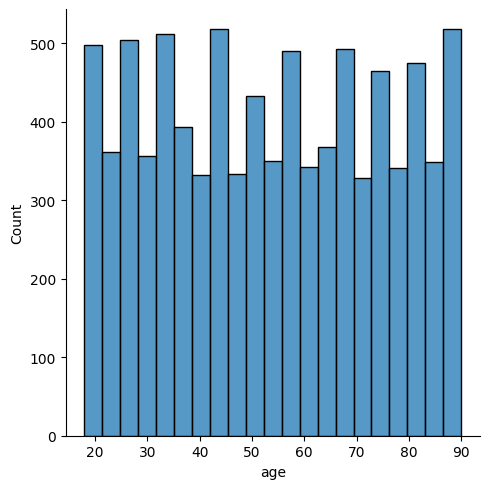

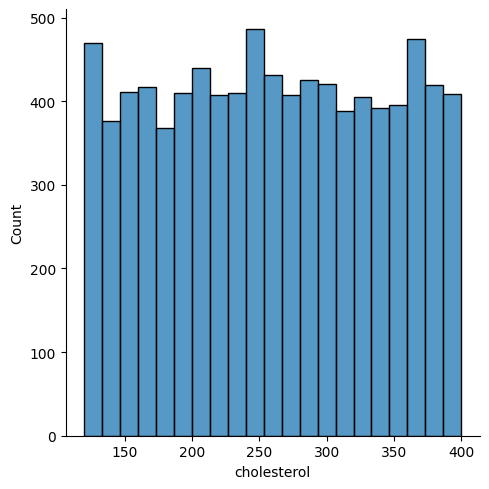

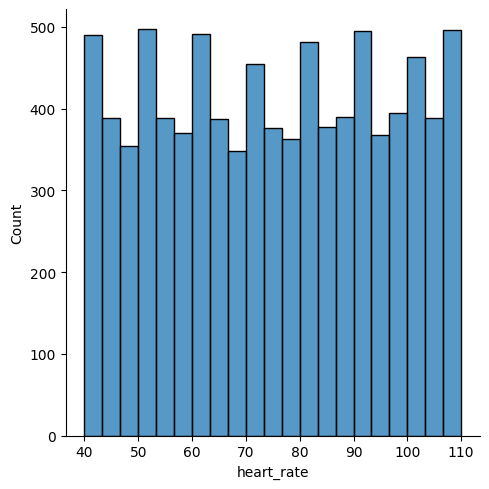

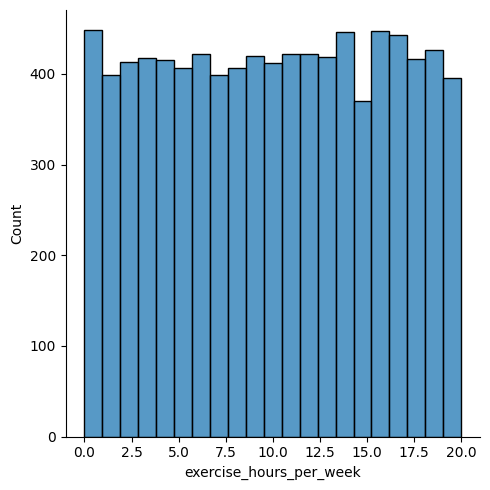

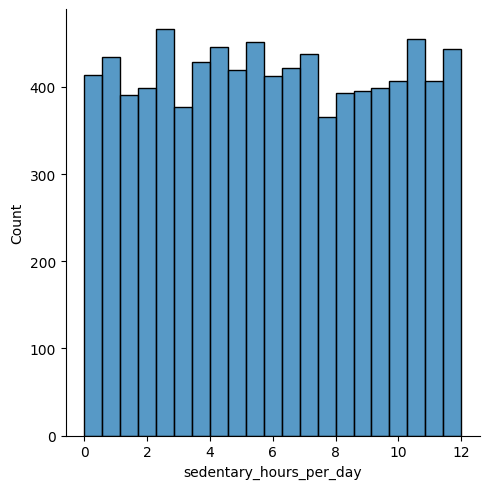

...

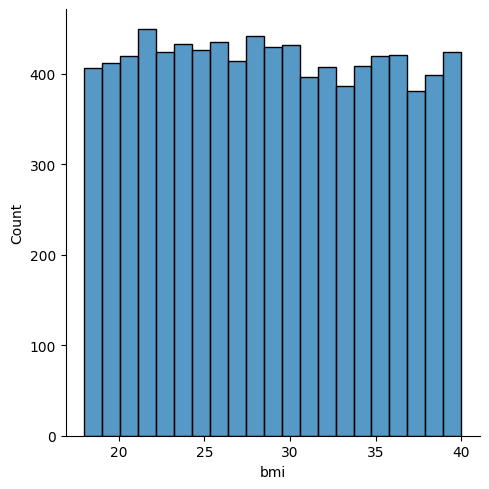

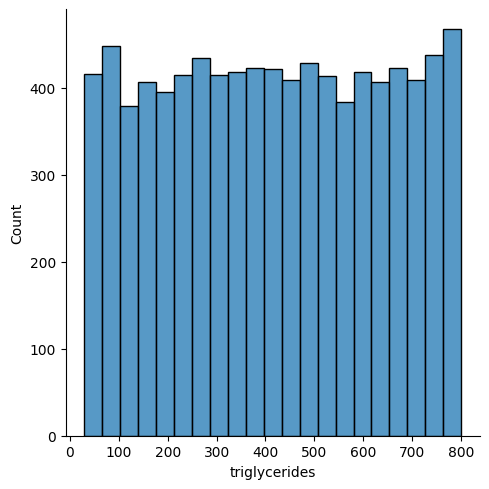

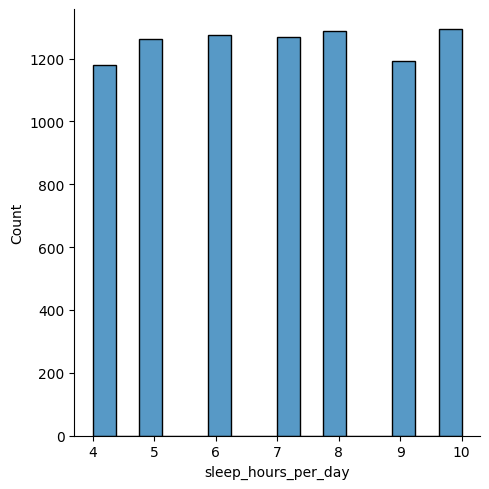

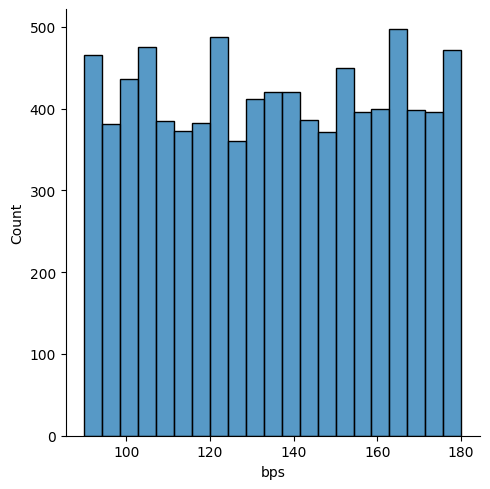

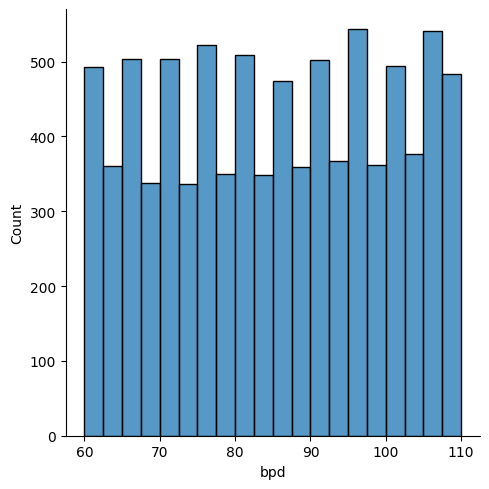

In [ ]:
#graficar la ditribución de las variables numéricas
for i in df_raw.describe().columns:
  sns.displot(data=df_raw, x=i)


contrario a lo que pensaba en el desbribe todas las distribuciones son más o menos uniformes

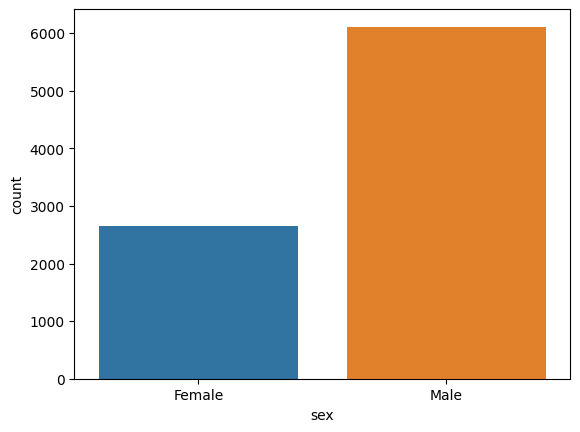

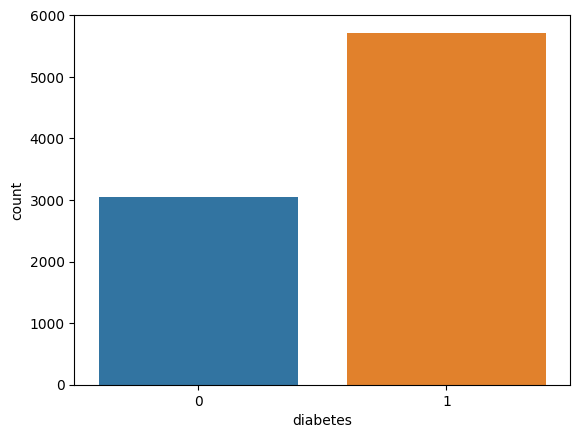

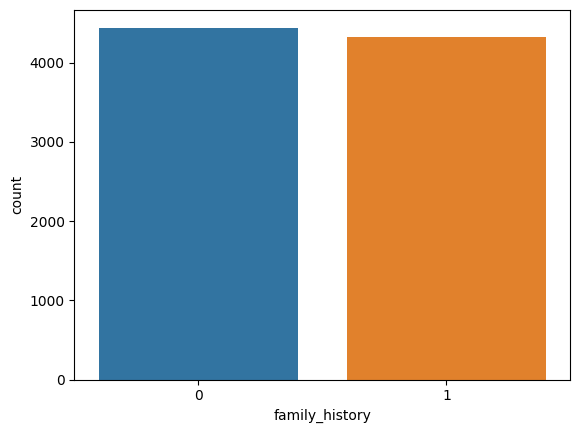

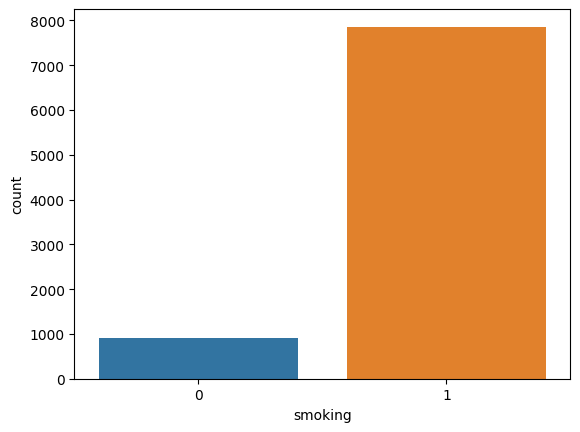

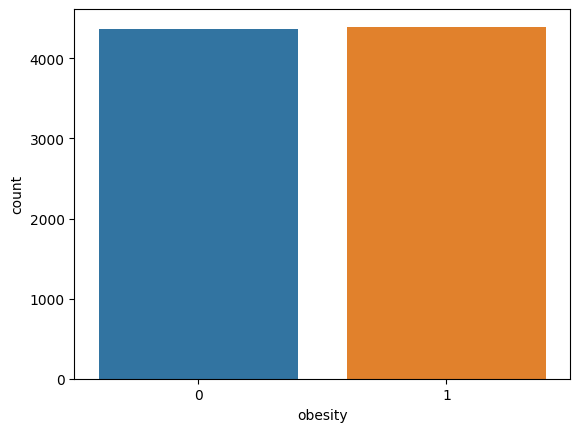

...

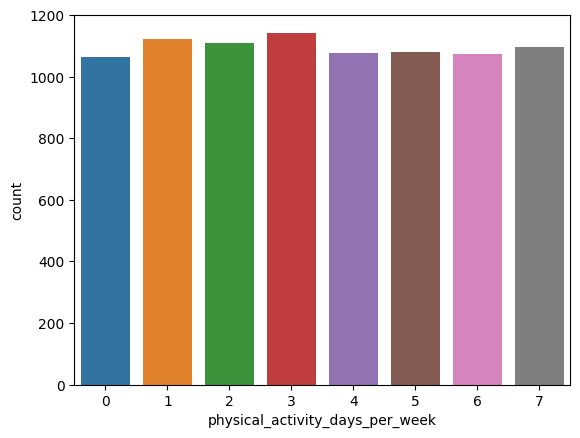

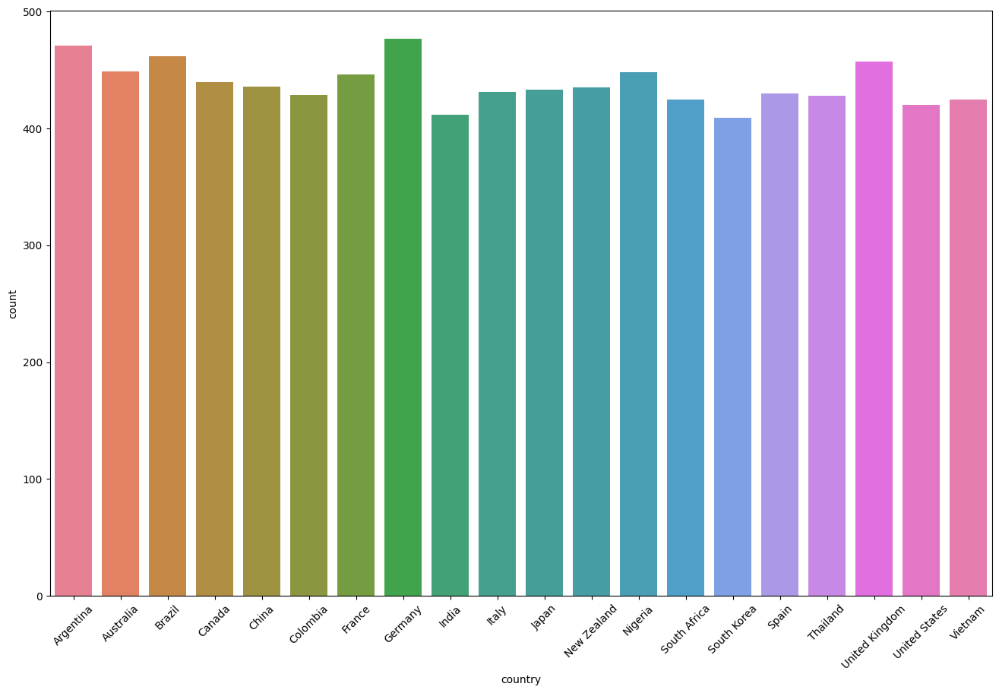

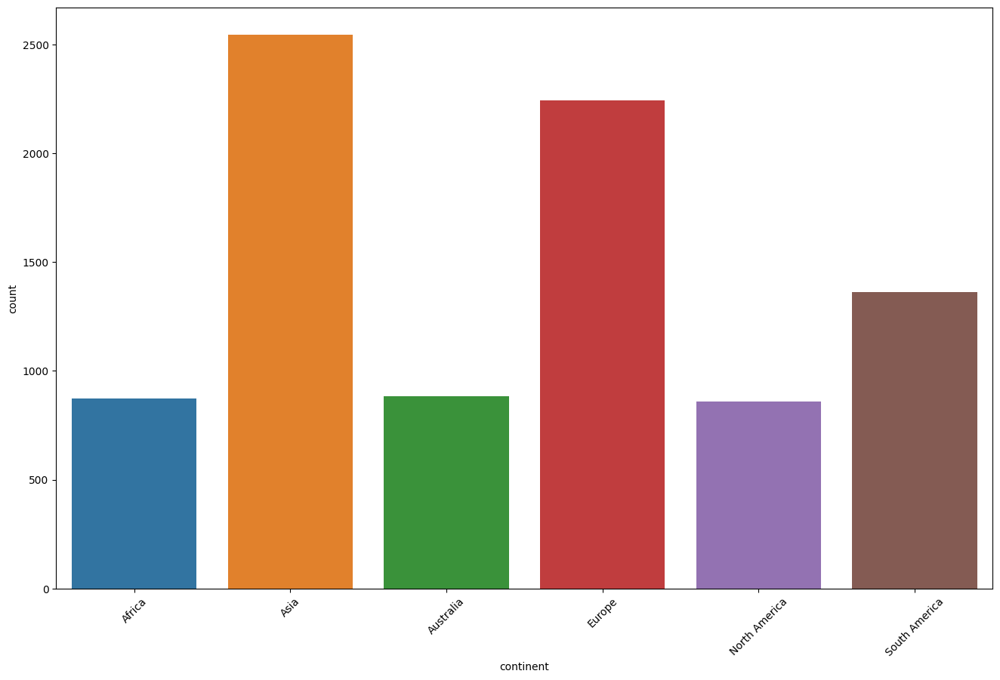

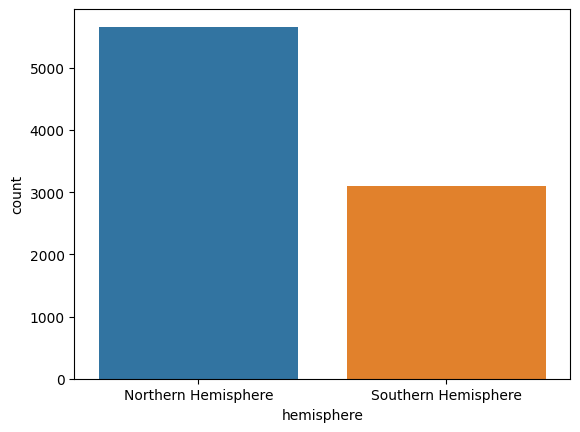

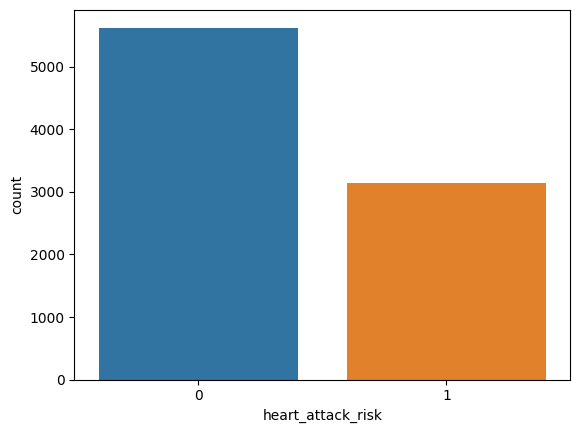

In [ ]:
#barplot de variables categóricas
for i in df_raw.describe(include='category').columns:
  if i in ['country','continent']:
    plt.figure(figsize=(16,10))
    sns.countplot(data=df_raw, x=i ,hue=i,legend=False)
    plt.xticks(rotation=45)
    plt.show()
  else:
    sns.countplot(data=df_raw, x=i ,hue=i,legend=False)
    plt.show()

 En estos gráficos se observan que muchas variables estan balanceadas.

**Excepto**: sexo a predominio masc, diabetes a predomionio SI, fumar a predominio SI, consumo de alcohol a predomnio SI, los continentes precipalmente representados son ASIA y EUROPA

Si bien los países individualmente tienen aprox la misma cantidad de observaciones hay más países europeos y asíaticos

la mayoria de los pacientes no tuvo eventos coronarios

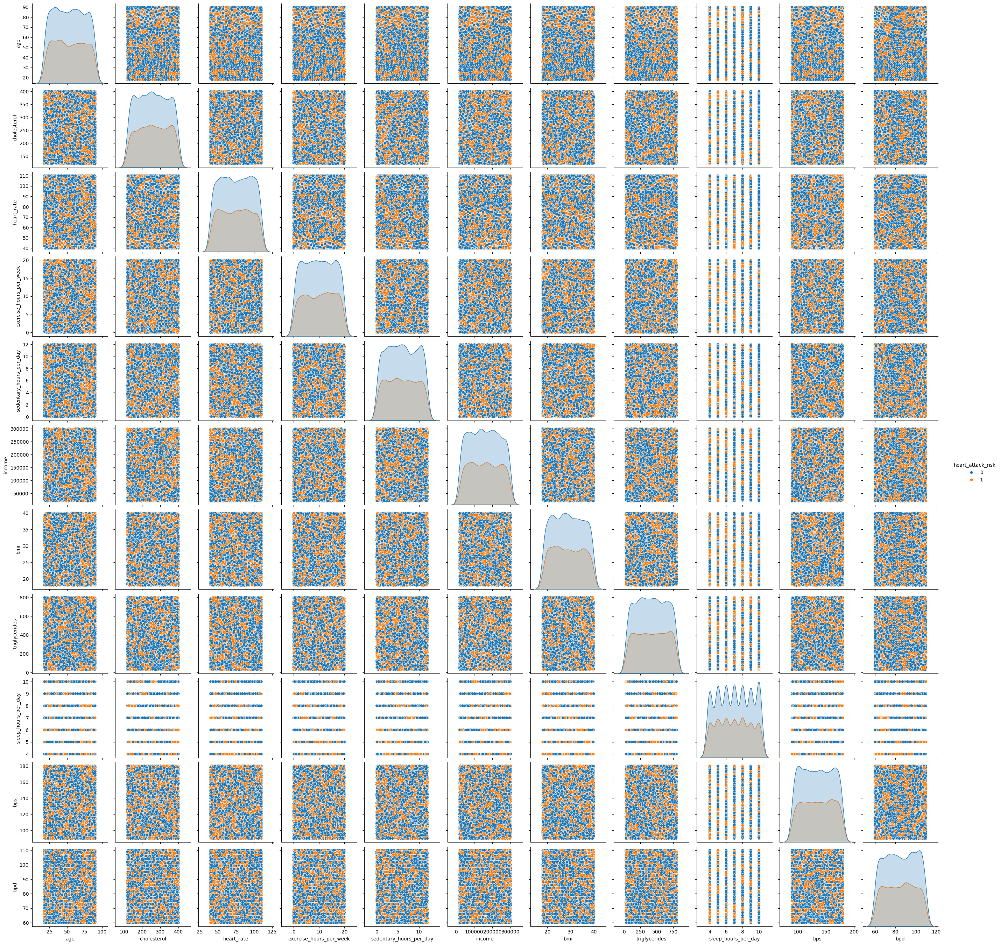

In [ ]:
#distribucion de las variables cuantitativas
sns.pairplot(data=df_raw,hue='heart_attack_risk')

Si bien este gráfrico tiene limitaciones visuales, ilustra la distribución uniforme de las variables cualitativas, lo que dificultará la implemetación de algoritmos como la regresión logística, svm, KNN.

## Análisis Bi y Tri variado


### Hipótesis 1: Relacionar los factores de riesgo cardiovacular con la cantidad de hs de ejercicio y sedentarismo

In [ ]:
# Creo una lista de las columnas que son factores de riesgo cardiovascular y las variables de interes
(df_raw.columns)
frcv_cat=['sex','diabetes','family_history','smoking','obesity','diet','previous_heart_problems','stress_level']
frcv_con=['age','cholesterol','bmi','triglycerides']
target=['exercise_hours_per_week','sedentary_hours_per_day','physical_activity_days_per_week']

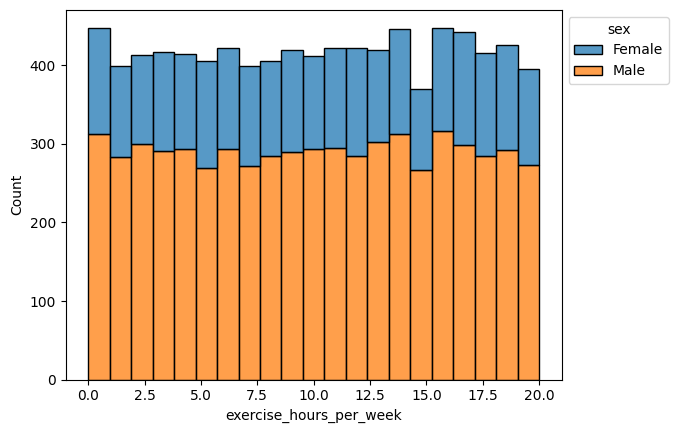

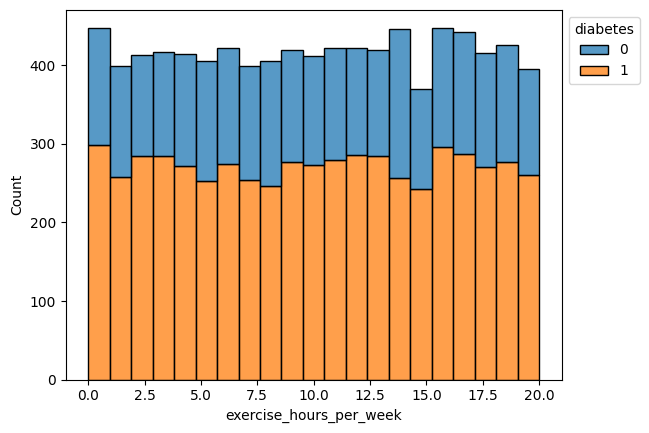

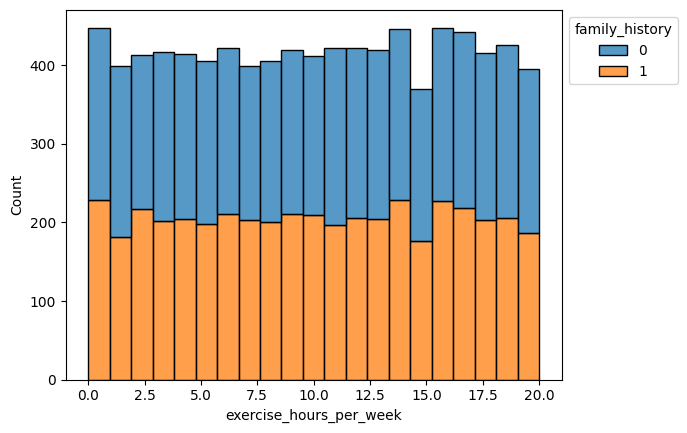

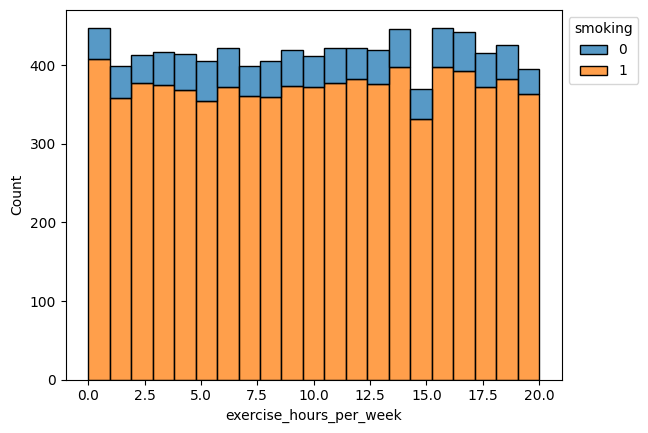

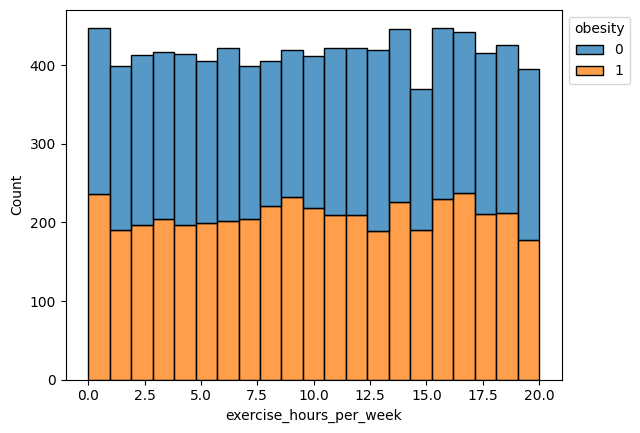

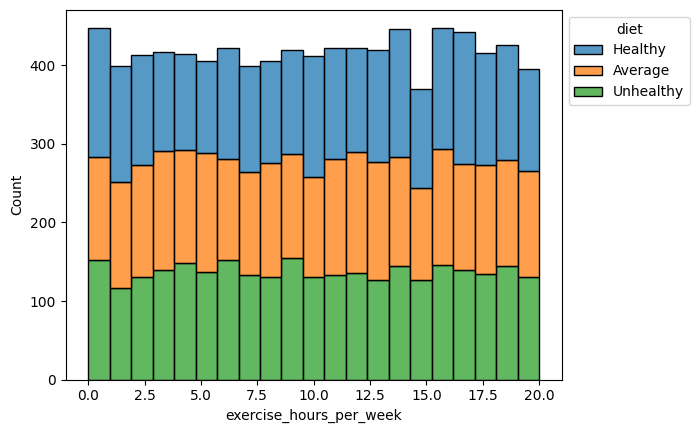

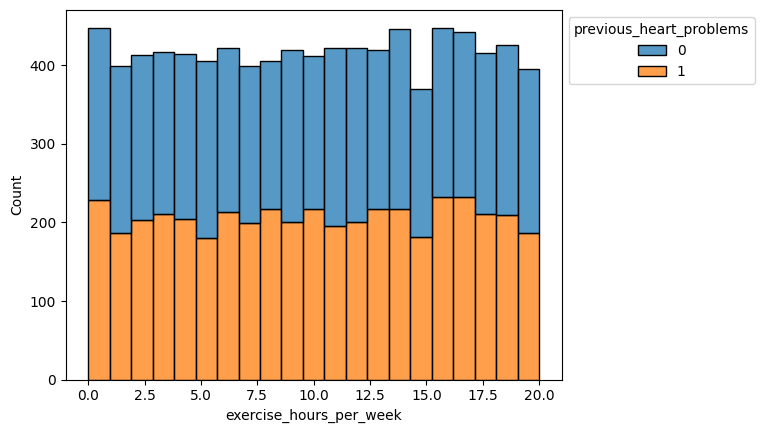

In [ ]:
# excercise hours per week a lo largo de las variables de interés

for f in frcv_cat[:-1]:
  ax=sns.histplot(data=df_raw,x=target[0], hue=f,multiple='stack')
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()


vemos distribucion uniforme de las hs de ejercicio en los sexos. Habiendo mayor cantidad de observaciones de los hombres

vemos distribucion uniforme de las hs de ejercicio en diabetes. Siendo mayor la cantidad de pacientes diabaticos dentro del df

vemos distribucion uniforme de las hs de ejercicio en antecedentes familiares. Habiendo una cantidad similar de observaciones

vemos distribucion uniforme de las hs de ejercicio en estatus de fumador. Siendo la mayoría fumadores

vemos distribucion uniforme de las hs de ejercicio en estatus de obeso. Siendo la cantidad de obesos similar en el df

vemos distribucion uniforme de las hs de ejercicio de acuerdo al tipo de dieta. la cantidad de obesrvaciones por categoria es más o menos similar

vemos distribucion uniforme de las hs de ejercicio de acuerdo al a la presencia previa de previuos heart problems. la cantidad de obesrvaciones por categoria es m'as o menos similar

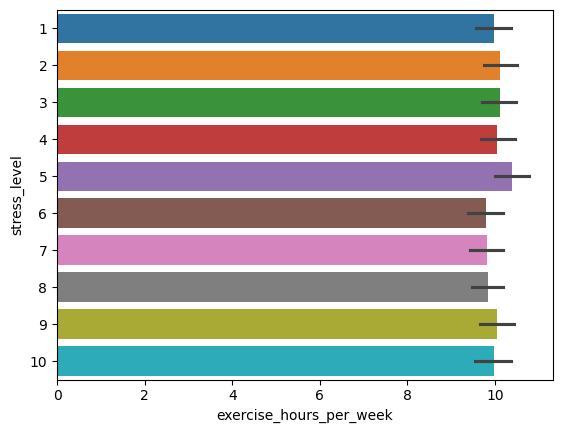

In [ ]:
#Hs de ejercicio a lo largo de los niveles de stress
sns.barplot(data=df_raw,x=target[0], y=frcv_cat[-1],hue=frcv_cat[-1],legend=False)
plt.show()


vemos distribucion uniforme de las hs de ejercicio a lo largo de los niveles de stress.

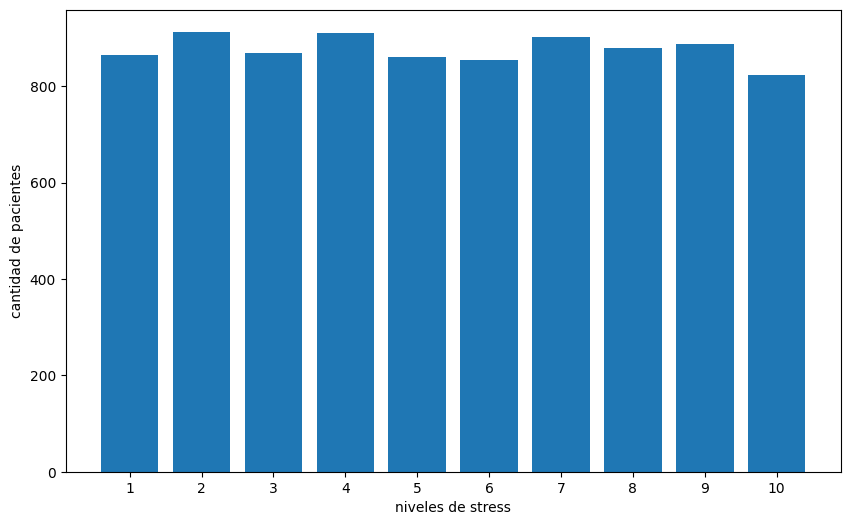

In [ ]:
#Contar la cantidad de osbservaciones por nivel de stress
fig,ax=plt.subplots(figsize=(10,6))
ax.bar(x=df_raw[frcv_cat[-1]].value_counts().index,height=df_raw[frcv_cat[-1]].value_counts().values)
ax.set_xticks(range(1,11))
ax.set_xlabel('niveles de stress')
ax.set_ylabel('cantidad de pacientes')
plt.show()

La cantidad de observaciones se similar a lo largo de los niveles de stress.

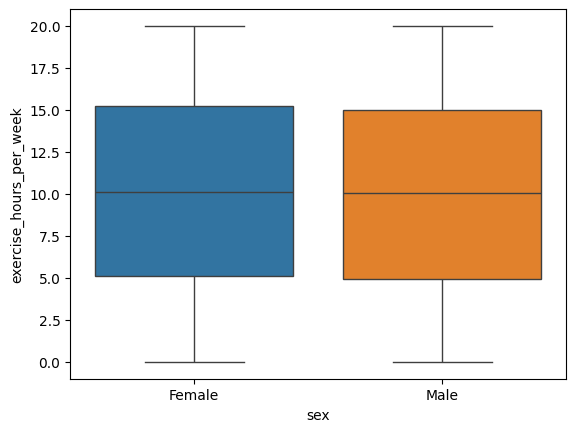

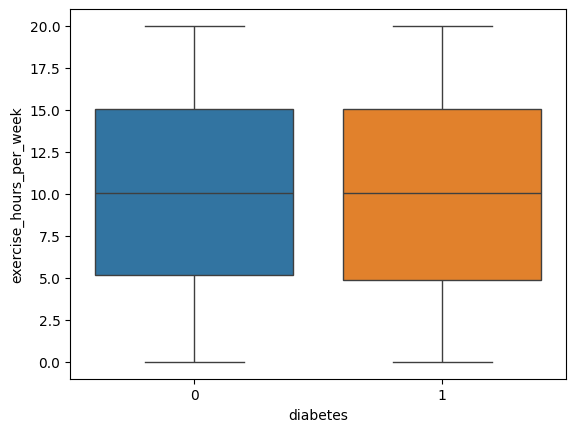

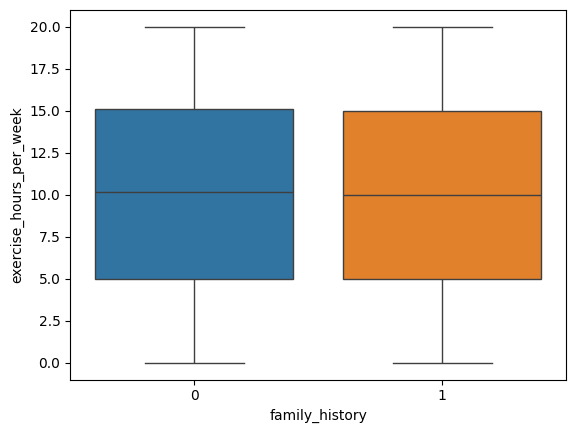

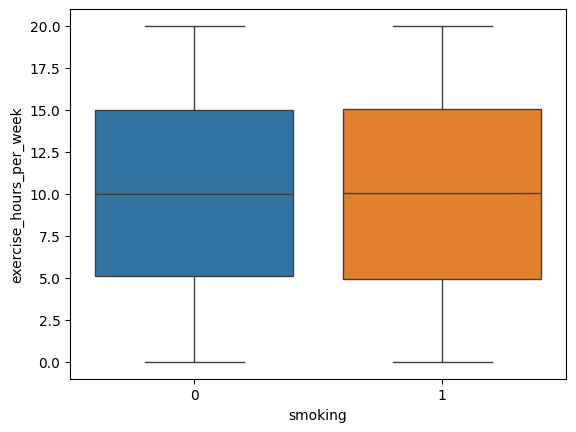

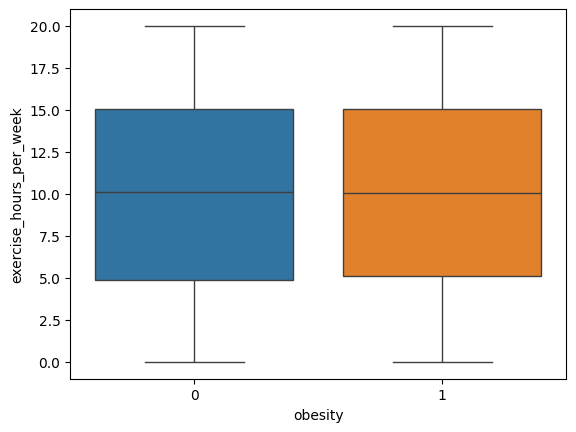

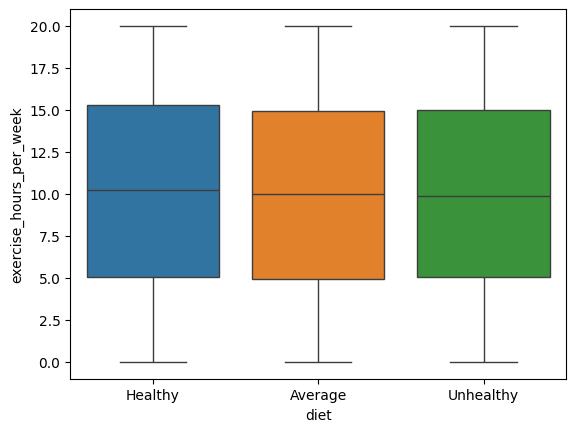

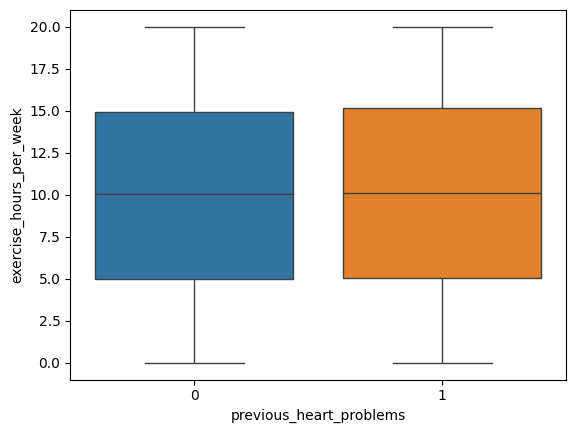

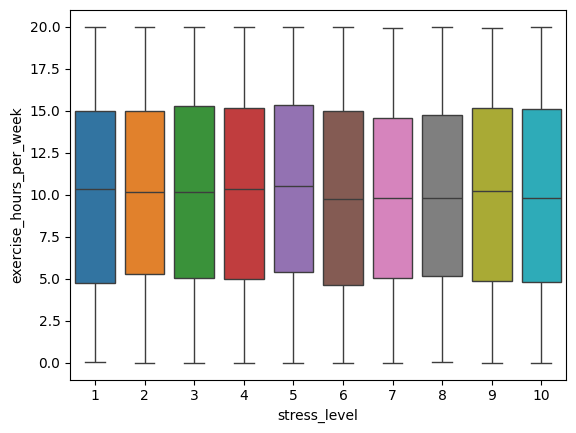

In [ ]:
#cuantificar hs de ejercicio a lo largo de las categorías de interes
for f in frcv_cat:
  sns.boxplot(data=df_raw,y=target[0],x=f,hue=f,legend=False)
  plt.show()


la cantidad de hs por ejercicio semanal es igual a lo largo de todas las categor'ias

 Como conclusión podemos decir por ahora la cantidad de ejercicio medida en hs por semana demuestra una distribución homogénea en esta base sintética, no habiendo grandes diferencias entre los FRCV. Los FRCV se ecuentran equilibrados entre las categorías excepto sexo masculino, diabetes y fumador.

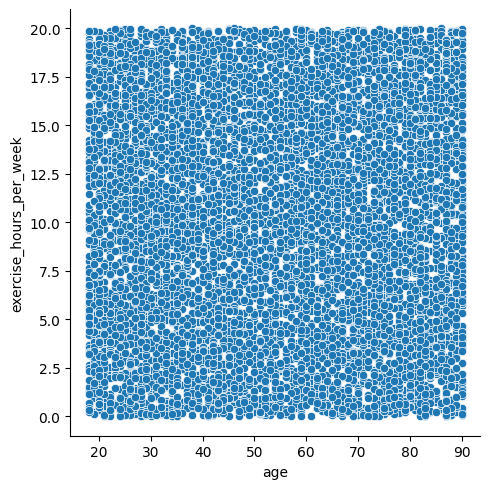

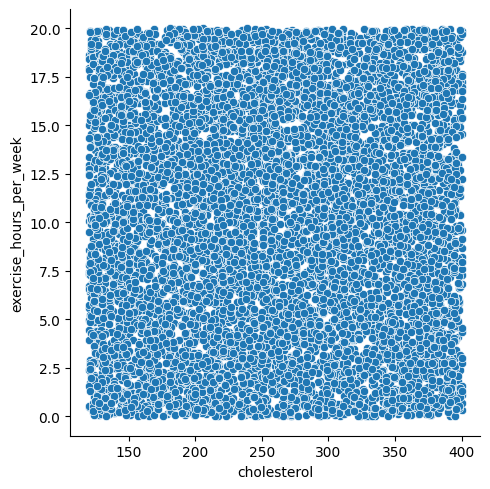

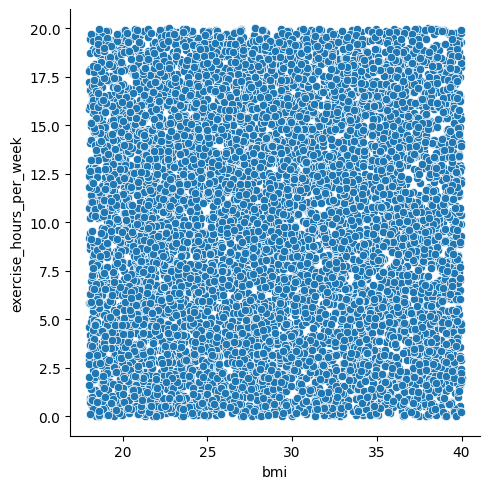

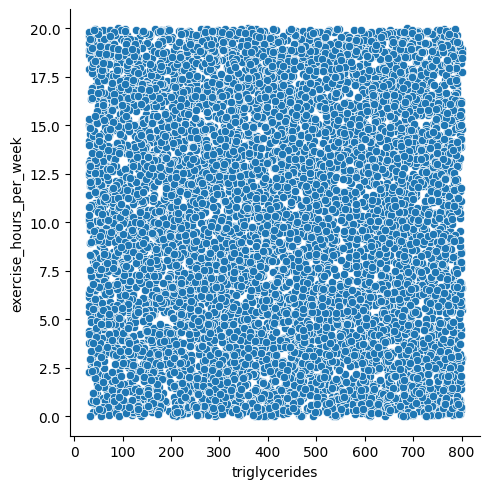

In [ ]:
#variables cuantitativas.
for f in frcv_con:
  sns.relplot(data=df_raw,x=f,y=target[0])
  plt.show()

En conclusión en esta base sintética no puede observarse relación entre BMI, TG, Col con actividad física

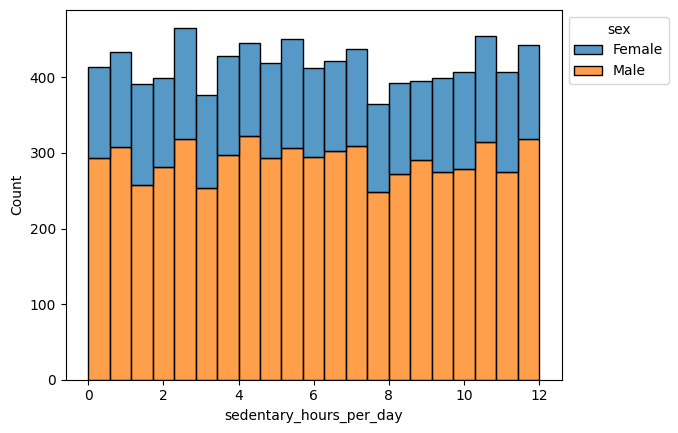

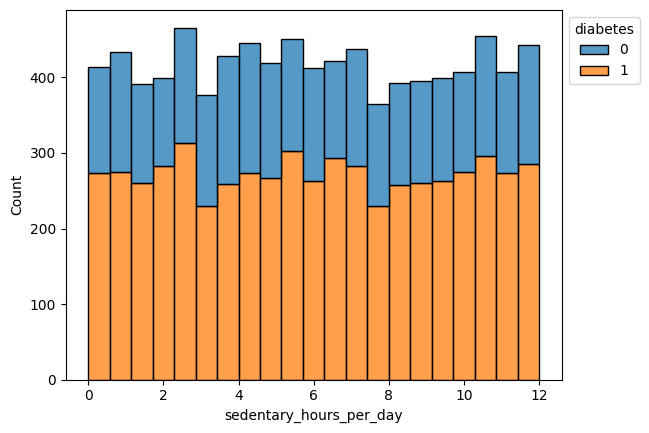

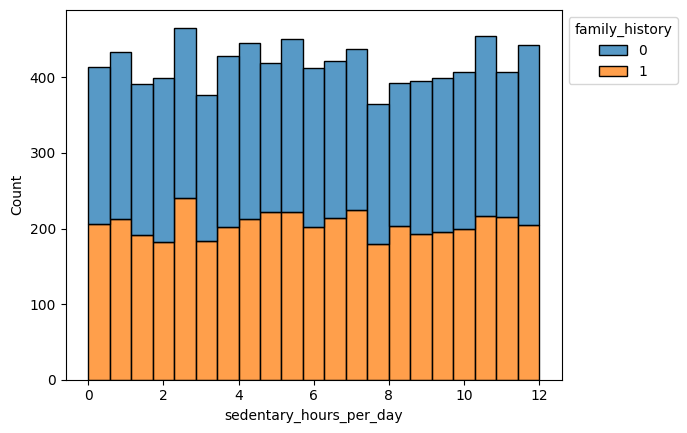

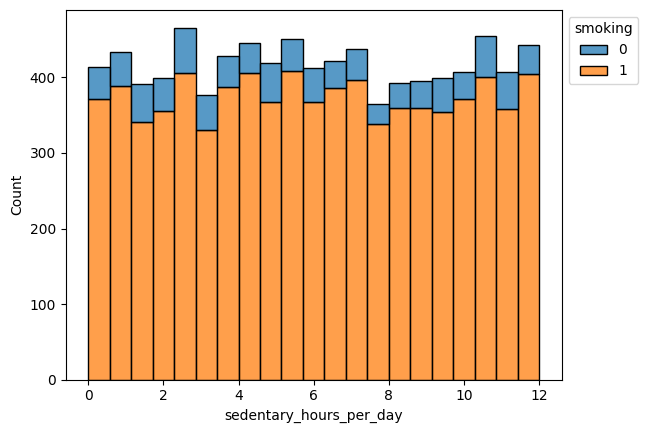

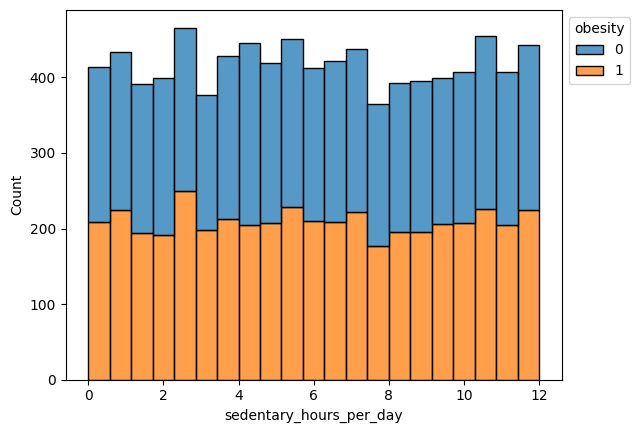

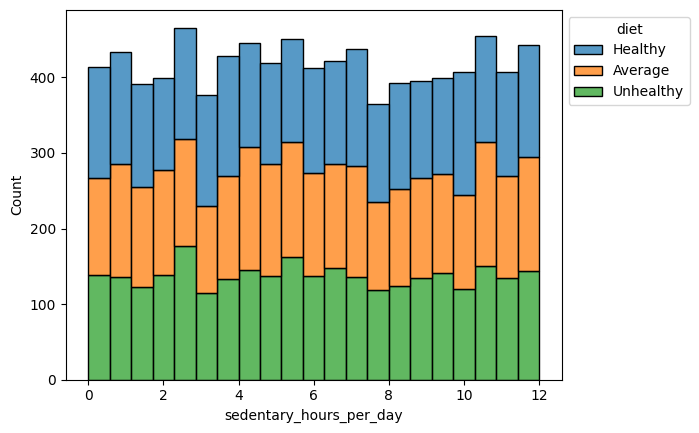

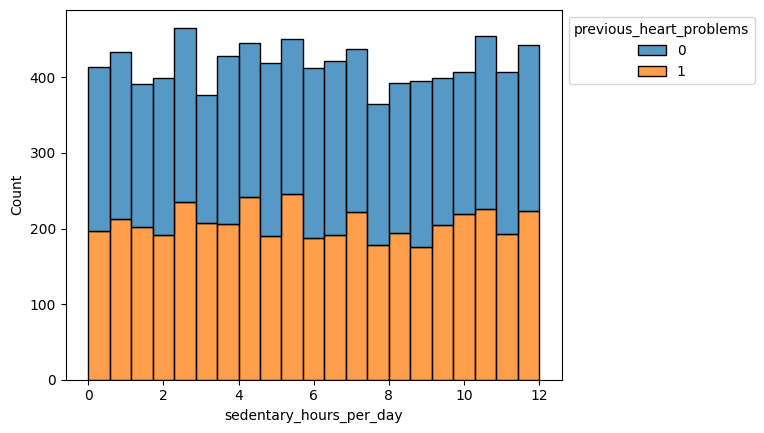

In [ ]:
#Cantidad de obesrvaciones a lo largo de las categorias
for f in frcv_cat[:-1]:
  ax=sns.histplot(data=df_raw,x=target[1], hue=f,multiple='stack')
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()

<Axes: xlabel='sedentary_hours_per_day', ylabel='stress_level'>

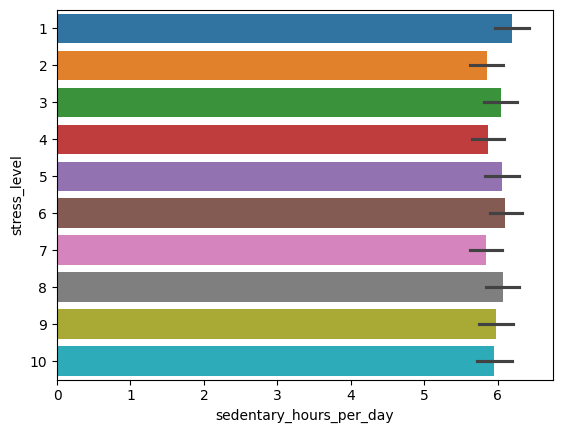

In [ ]:
#promedio de hs sedentarios por dia de acuerdo a los niveles de stress
sns.barplot(data=df_raw,x=target[1], y=frcv_cat[-1],hue=frcv_cat[-1],legend=False)

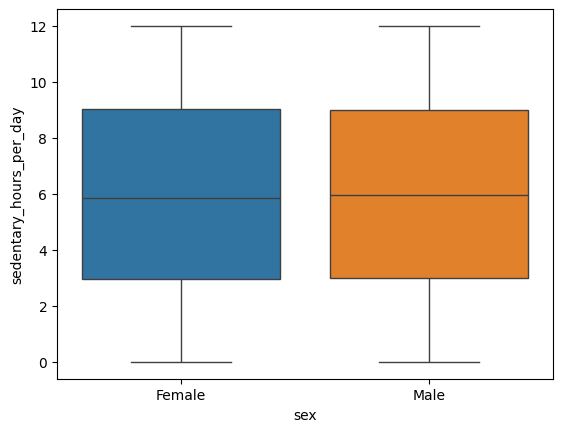

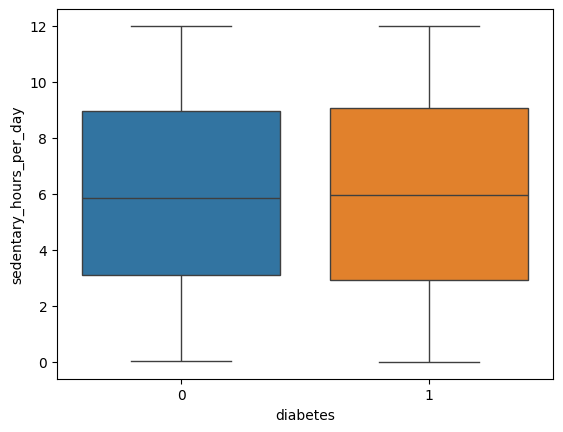

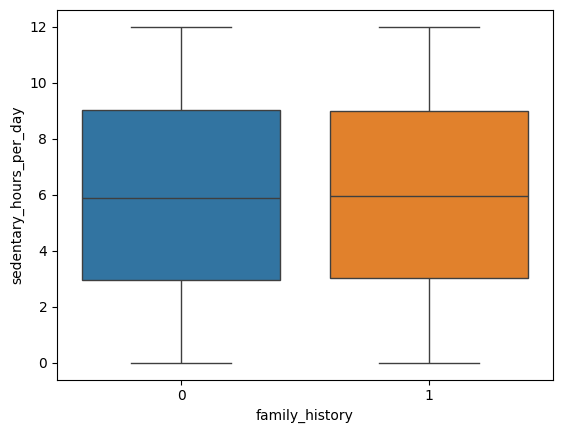

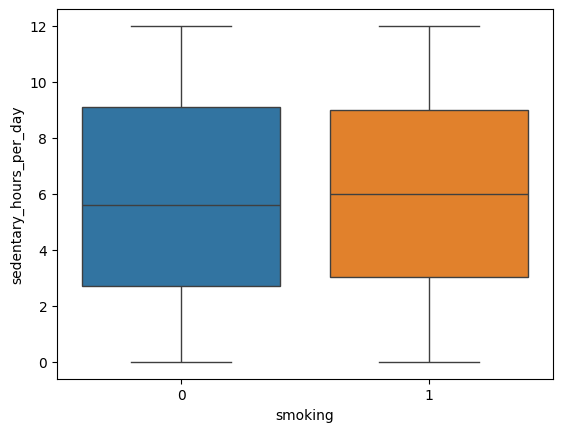

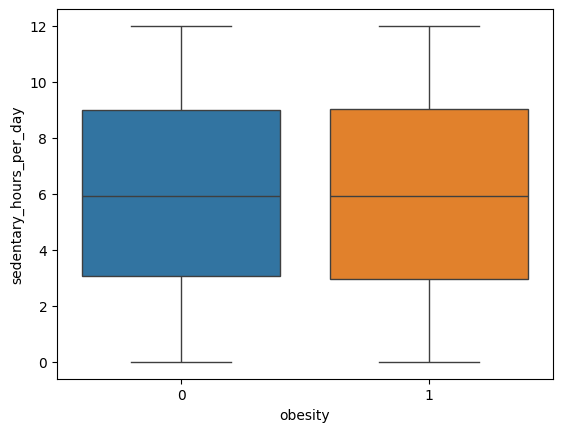

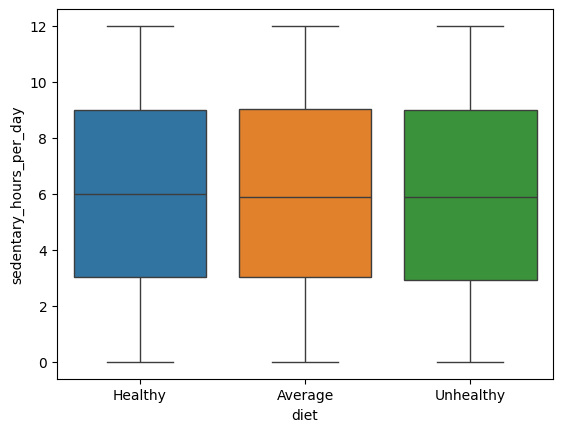

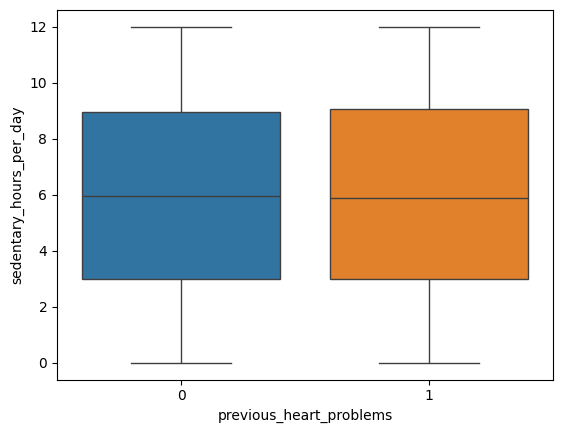

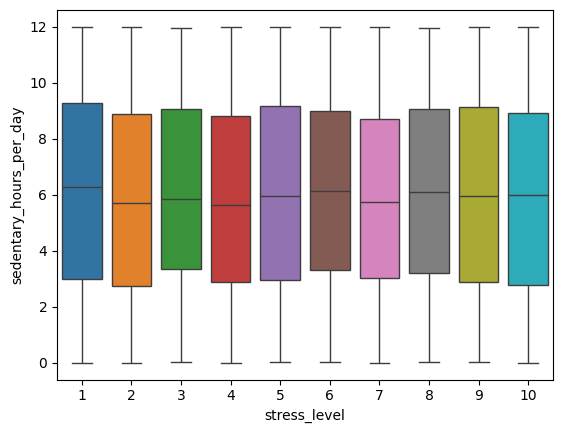

In [ ]:
#hs sedentarias por categoría
for f in frcv_cat:
  sns.boxplot(data=df_raw,y=target[1],x=f,hue=f,legend=False)
  plt.show()

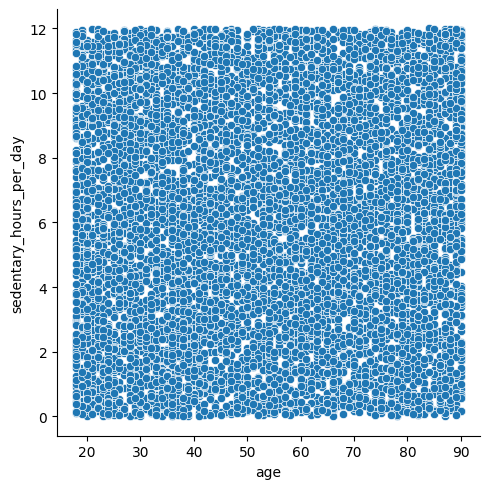

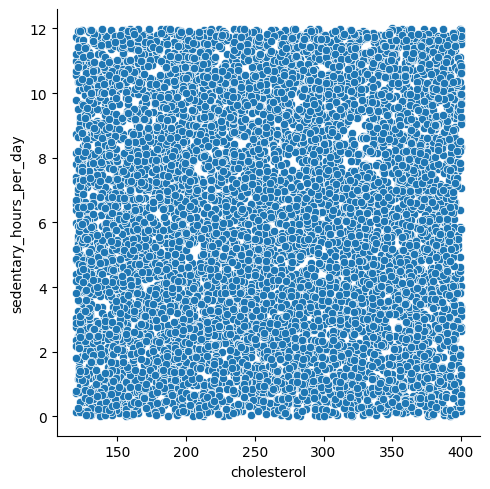

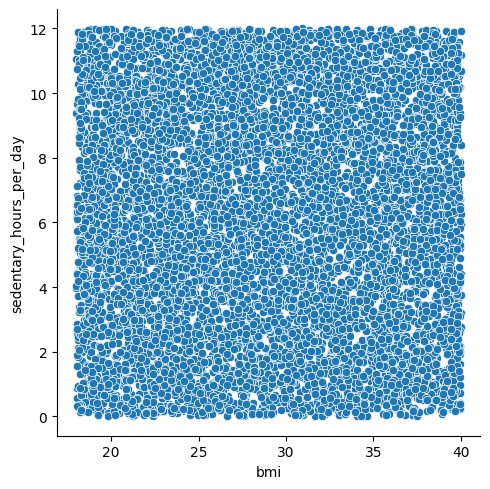

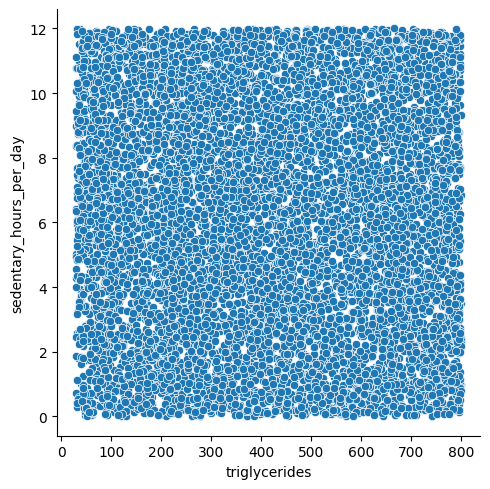

In [ ]:
#scatter plot de variables cuantitativas
for f in frcv_con:
  sns.relplot(data=df_raw,x=f,y=target[1])
  plt.show()

distribuciones homogeneas sin tendencias

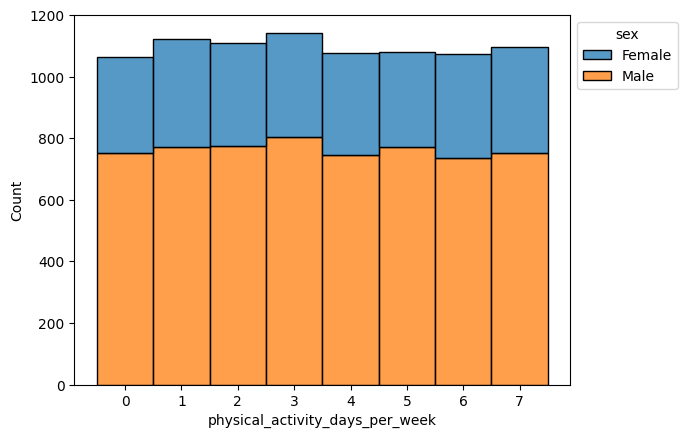

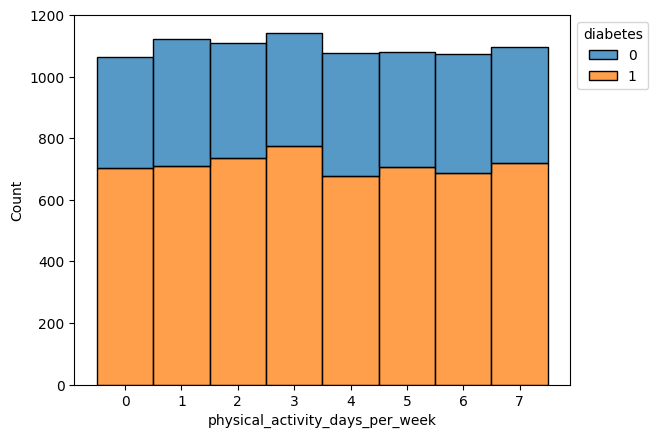

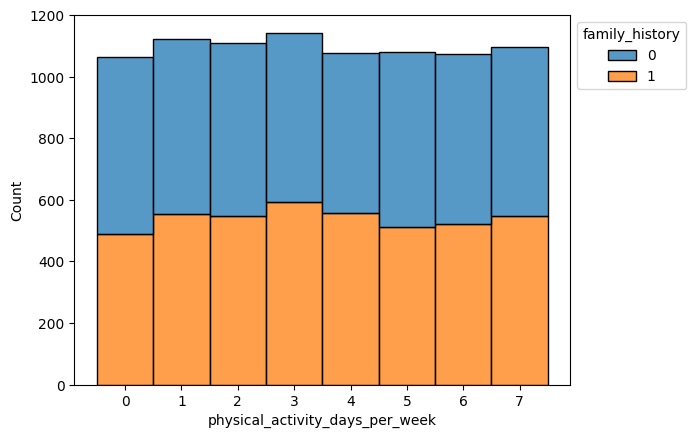

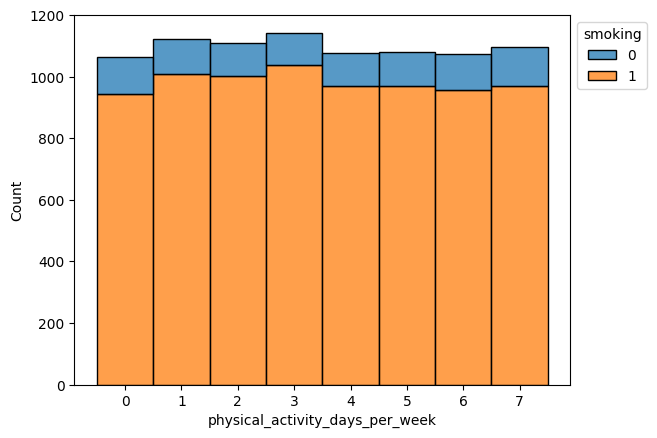

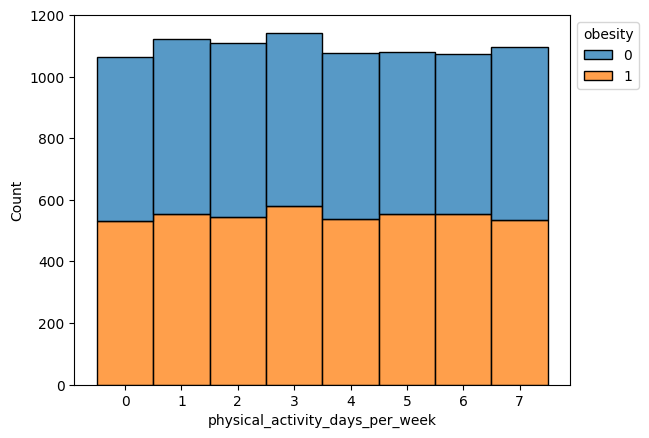

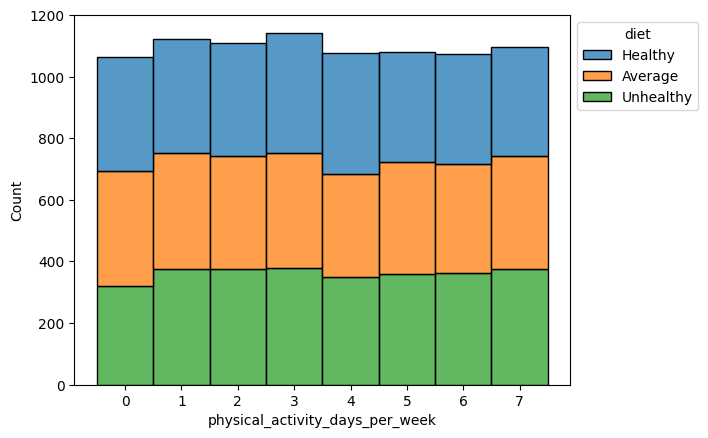

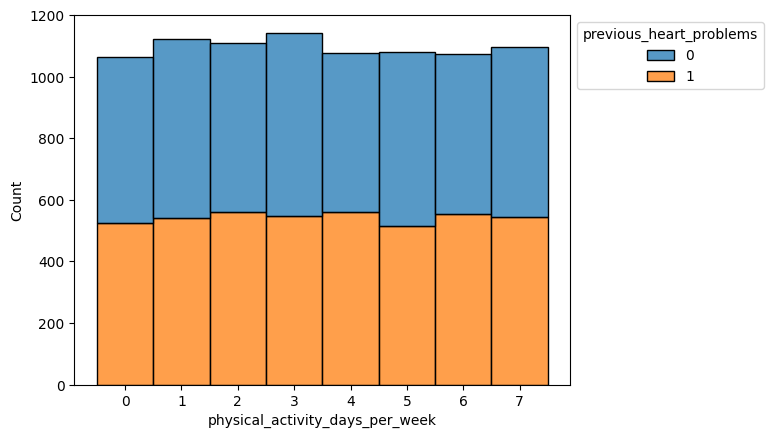

In [ ]:
#dias de actividad física a lo largo de las categorías
for f in frcv_cat[:-1]:
  ax=sns.histplot(data=df_raw,x=target[2], hue=f,multiple='stack')
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()

<Axes: xlabel='stress_level', ylabel='physical_activity_days_per_week'>

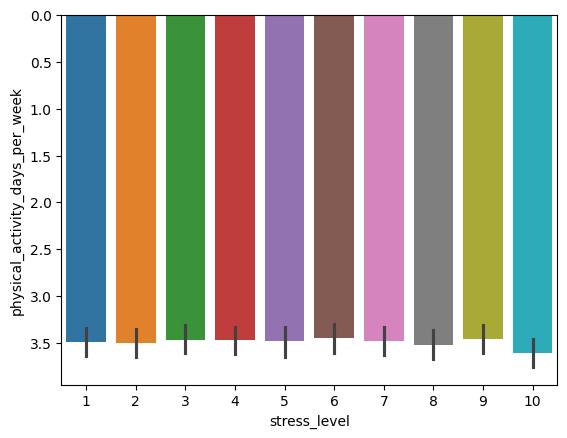

In [ ]:
#dias sedentarios a lo largo de las categorías
sns.barplot(data=df_raw,y=target[2], x=frcv_cat[-1],hue=frcv_cat[-1],legend=False)

todos los niveles de stress tienen mas o menos la misma cantidad de hs sedentarias

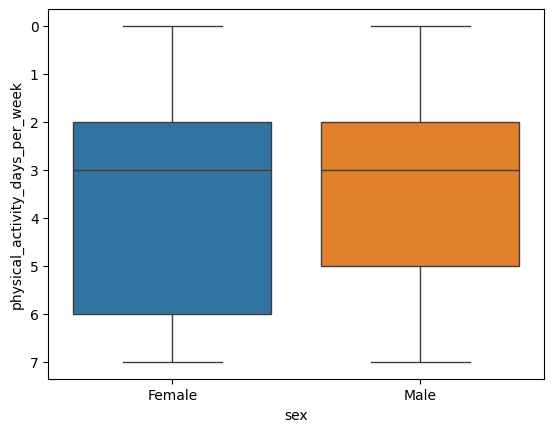

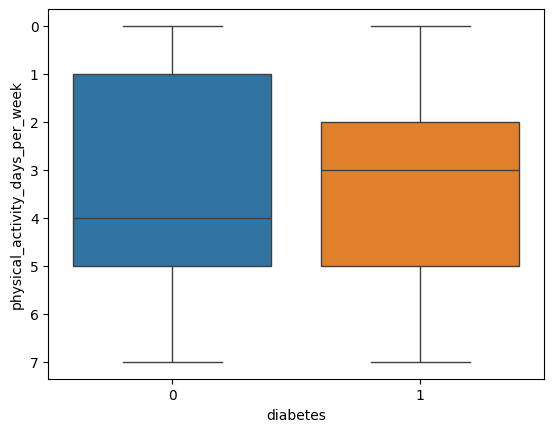

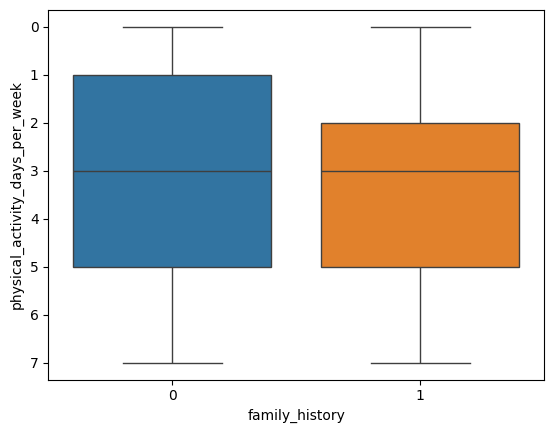

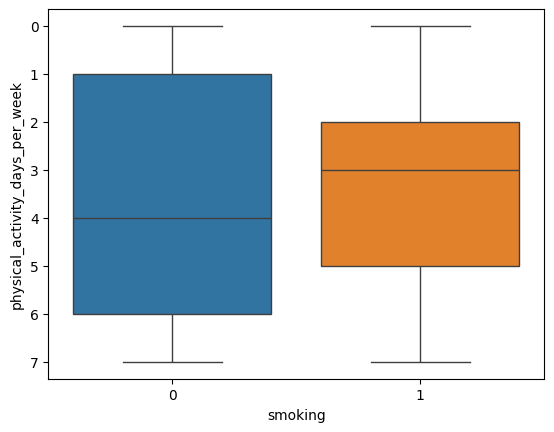

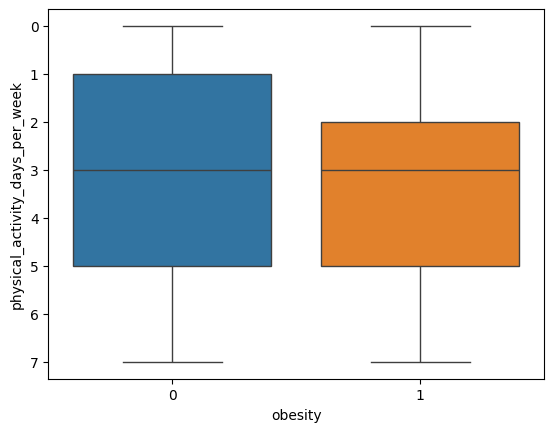

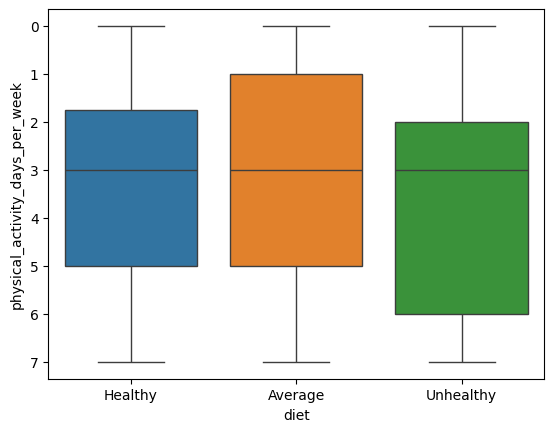

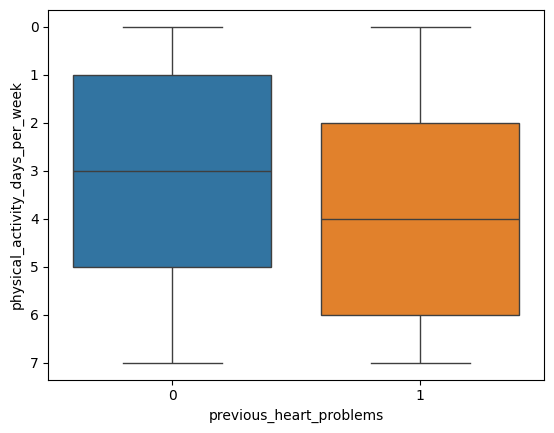

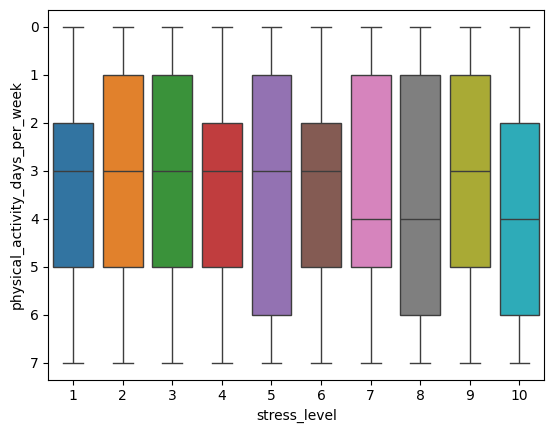

In [ ]:
#dias de actividad física a lo largo de las categorías de interés
for f in frcv_cat:
  sns.boxplot(data=df_raw,y=target[2],x=f,hue=f,legend=False)
  plt.show()

pareceria haber una diferencia en la media de los dias de actividad física en diabéticos, en fumadores (siendo mayor) y menor en pacientes con problemas cardiacos previos y nlos niveles 7-8-10 de stress

### Conclusión de la hipótesis 1: la cantidad de hs de ejercicio semanales y la cantidad de hs de sedentarismo no fueron influenciadas por los FRCV. Sin embargo, cuando se midió actividad física en cantidad de días de la semana se observò una mayor media (no comprobado estadìsticamente) en pacientes diabèticos y fumadores y menor en pacientes con problemas cardíacos previos y niveles de stress 7-8-10

### Hipótesis 2: Relacionar los niveles de tensión arterial sistólica y diastólica con los niveles de Stress

<Axes: xlabel='stress_level', ylabel='bps'>

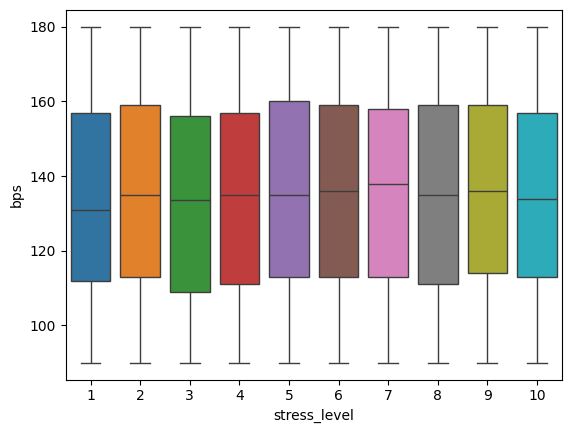

In [ ]:
sns.boxplot(data=df_raw,y='bps',x='stress_level',hue='stress_level',legend=False)

<Axes: xlabel='stress_level', ylabel='bpd'>

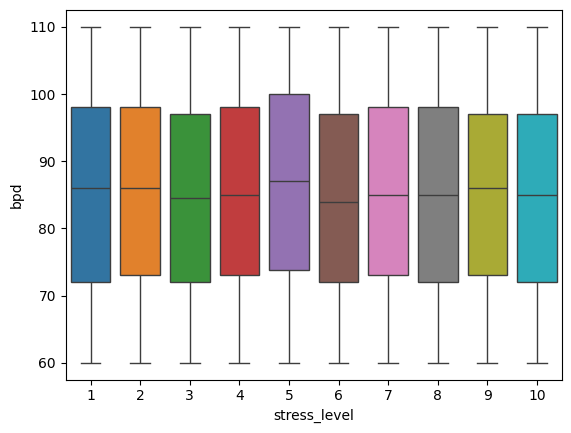

In [ ]:
sns.boxplot(data=df_raw,y='bpd',x='stress_level',hue='stress_level',legend=False)

la presión diastólica y sistólica no parece variar significativamente a lo largo de los niveles de stress

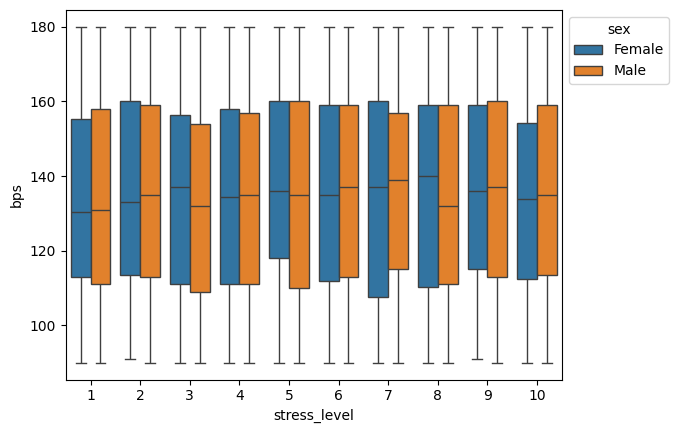

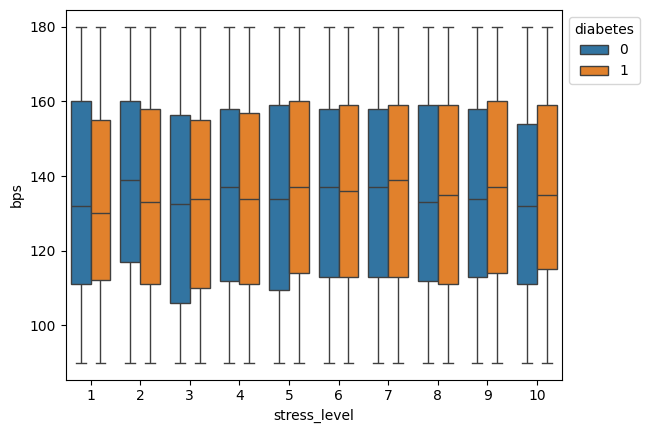

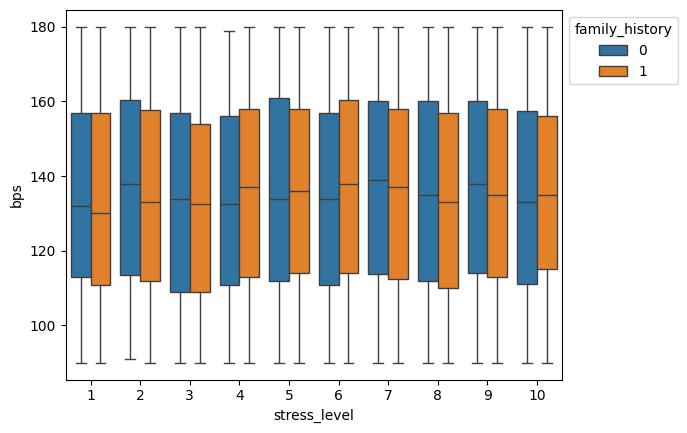

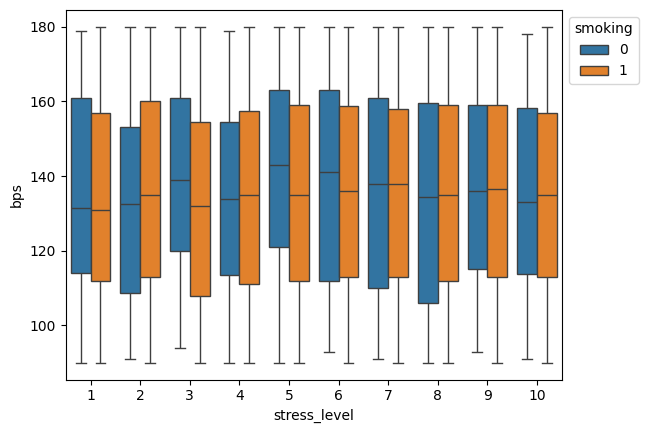

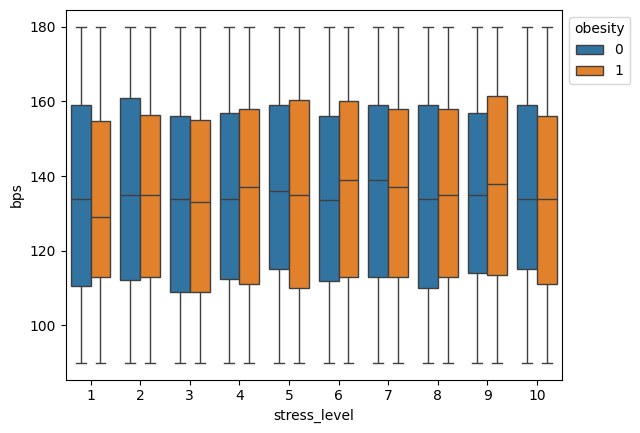

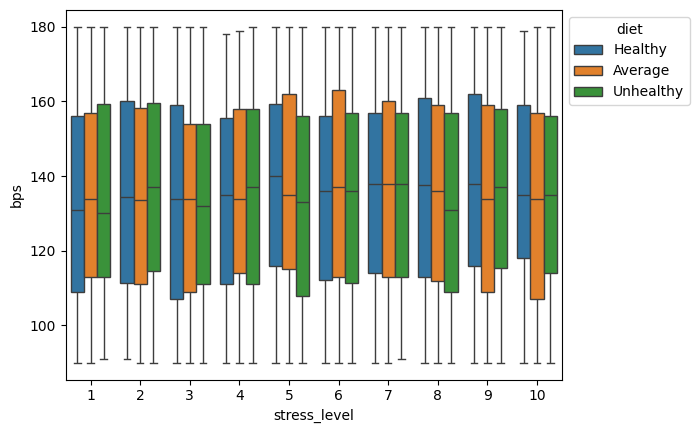

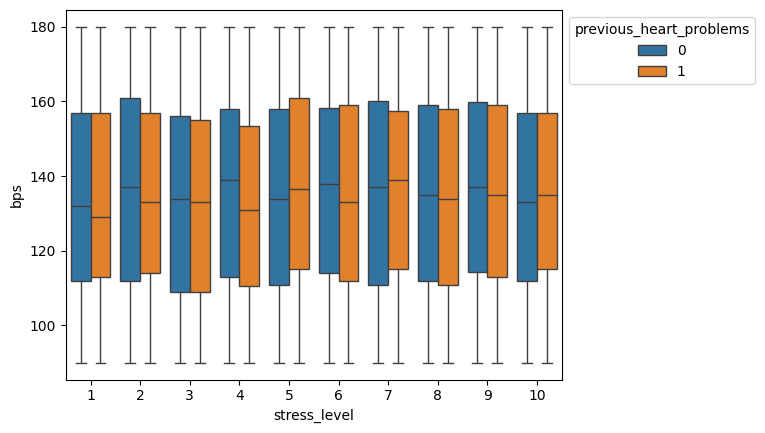

In [ ]:
for f in frcv_cat[:-1]:
  ax=sns.boxplot(data=df_raw,y='bps',x='stress_level',hue=f)
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()

Cuando segmentamos por los factores de riesgo categóricos no se observan grandes variaciones de las presiones sistólica o diastólica

### Conclusión de la hipótesis 2: Las presiones sistólicas y diastólicas no se vieron influenciadas significativamente por los niveles de stress. Aún despues por ajustar por factores de riesgo cardiovasculares la distribución y valores medios de las presiones no demostraron diferencias significativas.

### Hipótesis 3: Relacionar país, región con  la dieta

In [ ]:
#Recuerdo las listas con los FRCV y el target
target=df_raw.columns[-6:-3]
print(target)

Index(['country', 'continent', 'hemisphere'], dtype='object')


In [ ]:
df_raw.groupby([target[2]])[target[1]].value_counts()

hemisphere           continent    
Northern Hemisphere  Asia             2543
                     Europe           1380
                     North America     860
                     Africa            448
                     South America     429
                     Australia           0
Southern Hemisphere  South America     933
                     Australia         884
                     Europe            861
                     Africa            425
                     Asia                0
                     North America       0
Name: count, dtype: int64

In [ ]:
lista=df_raw.groupby([target[1]],as_index=False)[target[0]].value_counts()
lista[lista['count']!=0].reset_index(drop=True)

,continent,country,count
0,Africa,Nigeria,448
1,Africa,South Africa,425
2,Asia,China,436
3,Asia,Japan,433
4,Asia,Thailand,428
5,Asia,Vietnam,425
6,Asia,India,412
7,Asia,South Korea,409
8,Australia,Australia,449
9,Australia,New Zealand,435


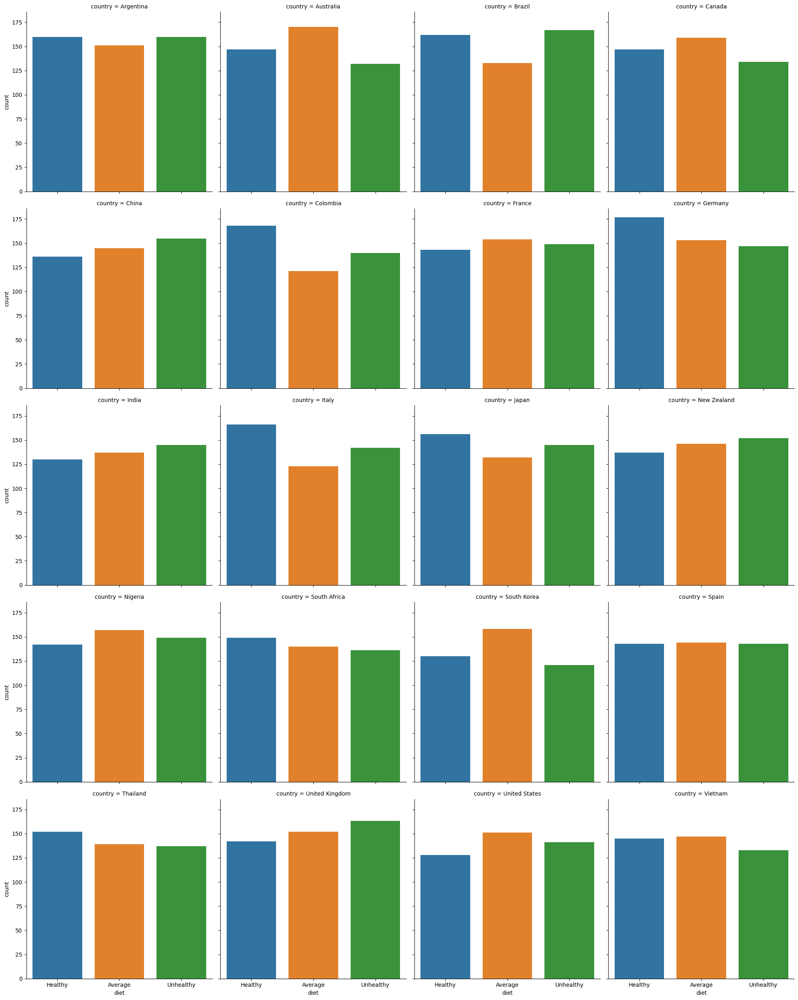

In [ ]:
#Dietas a lo largo de los países
sns.catplot(data=df_raw,x='diet',col=target[0],col_wrap=4,kind='count', hue='diet')

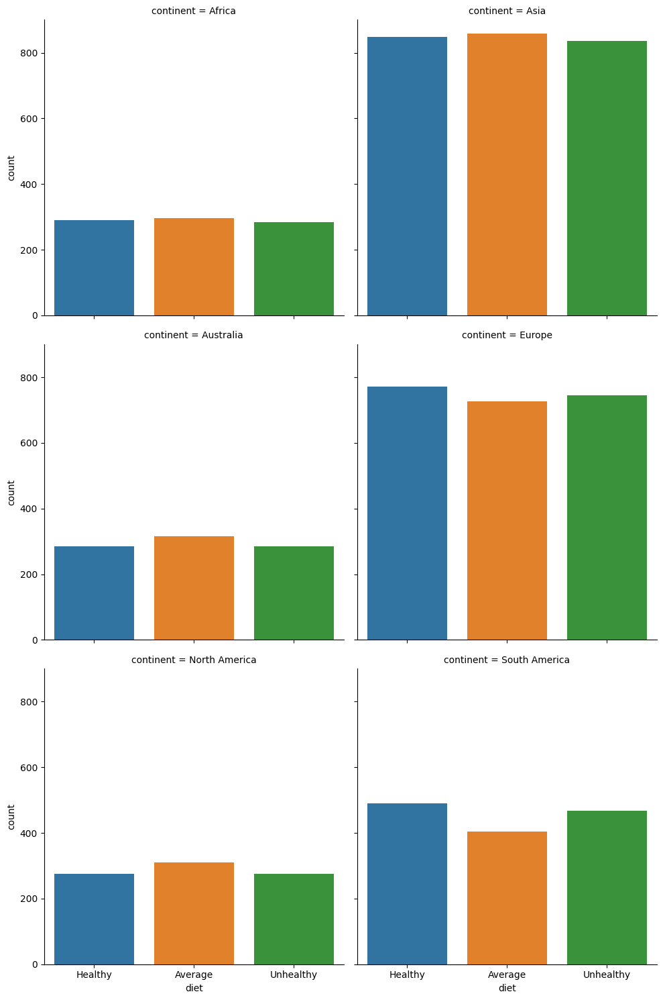

In [ ]:
# Cantidad de observaciones por continente
sns.catplot(data=df_raw,x='diet',col=target[1],col_wrap=2,kind='count', hue='diet')

Asia, europa y america del sur tienen la mayor cantidad de observaciones, pero la distribuci'on en general por continente es similar

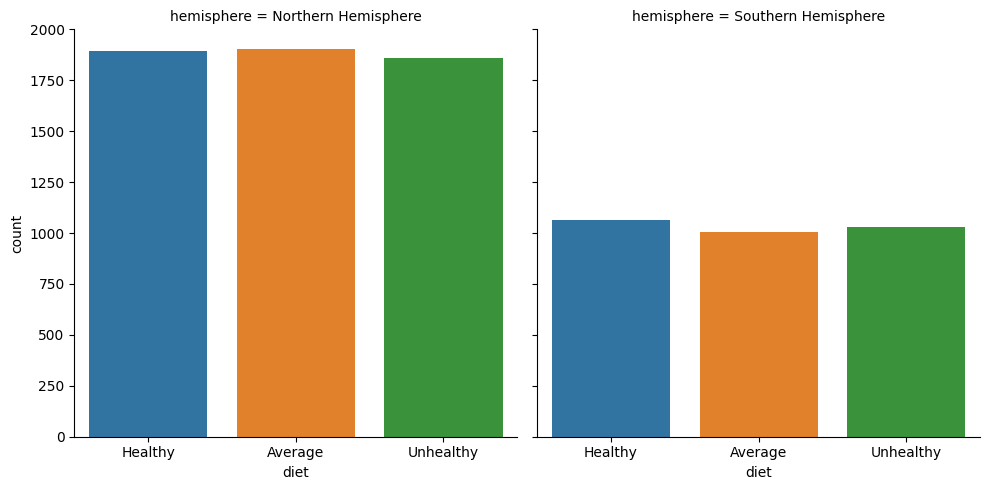

In [ ]:
# observaciones por hemisferio
sns.catplot(data=df_raw,x='diet',col=target[2],kind='count', hue='diet')

hay mayor observacion de eventos en el hemisferio norte, las dietas siguen distribucion similar

In [ ]:
df_raw.head()

,patient_id,age,sex,cholesterol,heart_rate,diabetes,family_history,smoking,obesity,alcohol_consumption,exercise_hours_per_week,diet,previous_heart_problems,medication_use,stress_level,sedentary_hours_per_day,income,bmi,triglycerides,physical_activity_days_per_week,sleep_hours_per_day,country,continent,hemisphere,heart_attack_risk,bps,bpd
0,BMW7812,67,Male,208,72,0,0,1,0,0,4.17,Average,0,0,9,6.62,261404,31.25,286,0,6,Argentina,South America,Southern Hemisphere,0,158,88
1,CZE1114,21,Male,389,98,1,1,1,1,1,1.81,Unhealthy,1,0,1,4.96,285768,27.19,235,1,7,Canada,North America,Northern Hemisphere,0,165,93
2,BNI9906,21,Female,324,72,1,0,0,0,0,2.08,Healthy,1,1,9,9.46,235282,28.18,587,4,4,France,Europe,Northern Hemisphere,0,174,99
3,JLN3497,84,Male,383,73,1,1,1,0,1,9.83,Average,1,0,9,7.65,125640,36.46,378,3,4,Canada,North America,Northern Hemisphere,0,163,100
4,GFO8847,66,Male,318,93,1,1,1,1,0,5.80,Unhealthy,1,0,6,1.51,160555,21.81,231,1,5,Thailand,Asia,Northern Hemisphere,0,91,88


### Conclusión de la Hipótesis 3: No se observa variación regional de la dieta en los distintos grupos geográficos analizados

# El objetivo del trabajo final es derivar y validar un modelo que prediga la probabilidad de padecer un evento coronario.
Variable target: heart_attack_risk

Esta tarea requiere un algoritmo de aprendizaje supervisado de tipo clasificación.

## Feaure Engineering
En la siguiente sección se realizará la matriz de correlación para determinar la correlación entre las variables. De esta manera veremos si podemos utilizar menos variables para nuestro modelo.
Del pair plot realizado en la sección anterior se desprende a simple vista que no hay un plano de separación claro por lo tanto métodos de clasificación que generen lineas, como regresión logística o SVM o métododos que de clasificación por cluster no tendrán buenos resultados.
Se pasará entonces a utilizar un modelo de arbol de decición y random forest. De manera exploratoria se utilizarán otras técnicas.

In [ ]:
df_raw.head()

,patient_id,age,sex,cholesterol,heart_rate,diabetes,family_history,smoking,obesity,alcohol_consumption,exercise_hours_per_week,diet,previous_heart_problems,medication_use,stress_level,sedentary_hours_per_day,income,bmi,triglycerides,physical_activity_days_per_week,sleep_hours_per_day,country,continent,hemisphere,heart_attack_risk,bps,bpd
0,BMW7812,67,Male,208,72,0,0,1,0,0,4.17,Average,0,0,9,6.62,261404,31.25,286,0,6,Argentina,South America,Southern Hemisphere,0,158,88
1,CZE1114,21,Male,389,98,1,1,1,1,1,1.81,Unhealthy,1,0,1,4.96,285768,27.19,235,1,7,Canada,North America,Northern Hemisphere,0,165,93
2,BNI9906,21,Female,324,72,1,0,0,0,0,2.08,Healthy,1,1,9,9.46,235282,28.18,587,4,4,France,Europe,Northern Hemisphere,0,174,99
3,JLN3497,84,Male,383,73,1,1,1,0,1,9.83,Average,1,0,9,7.65,125640,36.46,378,3,4,Canada,North America,Northern Hemisphere,0,163,100
4,GFO8847,66,Male,318,93,1,1,1,1,0,5.80,Unhealthy,1,0,6,1.51,160555,21.81,231,1,5,Thailand,Asia,Northern Hemisphere,0,91,88


### Missing values
No es necesario reemplazar valores perdidos, ya que al ser una base de datos sintética, no es necesario.

### Encoding.
Las variables categóricas y el target serán cambiadas con label encoding. One hot encoding no se realizará para no aumentar el número de columnas.

In [ ]:
#drop patient ID
df=df_raw.drop(columns='patient_id').copy()


In [ ]:
#verifico las categorias de las variables para poder mapearlas luego a los labels
for i in df.columns:
  if df[i].dtype=='category':
    print(i)
    print(str(df[i].cat.categories.unique()) + str(df[i].cat.codes.unique()))
    print('\n')


sex
Index(['Female', 'Male'], dtype='object')[1 0]


diabetes
Index([0, 1], dtype='int64')[0 1]


family_history
Index([0, 1], dtype='int64')[0 1]


smoking
Index([0, 1], dtype='int64')[1 0]


obesity
Index([0, 1], dtype='int64')[0 1]


alcohol_consumption
Index([0, 1], dtype='int64')[0 1]


diet
Index(['Healthy', 'Average', 'Unhealthy'], dtype='object')[1 2 0]


previous_heart_problems
Index([0, 1], dtype='int64')[0 1]


medication_use
Index([0, 1], dtype='int64')[0 1]


stress_level
Index([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], dtype='int64')[8 0 5 1 6 3 4 7 9 2]


physical_activity_days_per_week
Index([0, 1, 2, 3, 4, 5, 6, 7], dtype='int64')[0 1 4 3 5 6 7 2]


country
Index(['Argentina', 'Australia', 'Brazil', 'Canada', 'China', 'Colombia',
       'France', 'Germany', 'India', 'Italy', 'Japan', 'New Zealand',
       'Nigeria', 'South Africa', 'South Korea', 'Spain', 'Thailand',
       'United Kingdom', 'United States', 'Vietnam'],
      dtype='object')[ 0  3  6 16  7 10  2 13 18 19  4  9 1

In [ ]:
#cambio las variables categoricas a label encoding
for i in df.columns:
  if df[i].dtype=='category':
    df[i]=df[i].cat.codes


En la matriz de correlación se utilizará el método de Spearman ya que la distribución de las variables no es normal

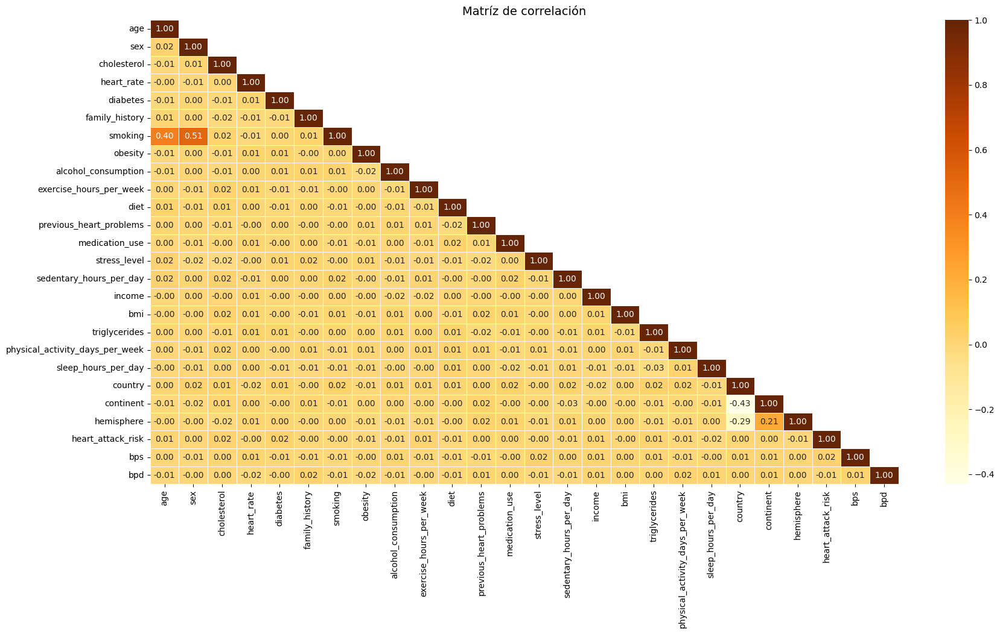

In [ ]:
corr = df.corr(method = 'spearman',numeric_only=True,)
# mask para quitar la parte superior del cuadrado
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
np.fill_diagonal(mask, False)
#heatmap sns
fig, ax = plt.subplots(figsize=(20,10))
plt.title('Matríz de correlación', fontsize=14)
heatmap = sns.heatmap(corr,
                      annot=True,
                      annot_kws={"fontsize": 10},
                      fmt='.2f',
                      linewidths=0.5,
                      cmap='YlOrBr',
                      mask=mask,
                      ax=ax)

parece que hay una correlación moderada positiva entre fumar y la edad.

además hay una correlación moderada y leve entre país y continente y hemisferio. Como era de esperarse.
No hay correlaciones significativas entre las otras variables

## Modelos de clasificación

In [ ]:
#target
y=df['heart_attack_risk'].values
#features
X=df.drop(columns='heart_attack_risk').values
feature_labels=df.columns[~df.columns.isin(['heart_attack_risk'])]

### Árbol de decisión

In [ ]:
#importo paquetes
from sklearn.model_selection import StratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay, f1_score, roc_curve, auc, RocCurveDisplay


Como la variable targe esta desvalanceada utilizó el estratificador Kfold para asegurarme que en el split entre test y train haya valanceo entre los valores que adquieren las variables.

In [ ]:
#Genero objeto estratificador
skf=StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

accuracy={}
precision={}
recall={}
f1score={}
#loop para combinar la profundidad y los casos por hoja
for d in range(1,11):
  for l in range(1,11):
  # uso K folds por el desvalanceo entre las categorias de las target
    clf = DecisionTreeClassifier( max_depth=d,min_samples_leaf=l/100)
    for train_index, test_index in skf.split(X, y):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        clf.fit(X_train, y_train)
        pred = clf.predict(X_test)
        #guardo las metricas en diccionarios
        accuracy[f'prof ={str(d)},min_samp= {str(l/100)}']=round(accuracy_score(y_test, pred),2)
        precision[f'prof ={str(d)},min_samp= {str(l/100)}']=round(precision_score(y_test, pred),2)
        recall[f'prof ={str(d)},min_samp= {str(l/100)}']=round(recall_score(y_test, pred),2)
        f1score[f'prof ={str(d)},min_samp= {str(l/100)}']=round(f1_score(y_test, pred),2)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defin

In [ ]:
#genero dataframe con metricas
f1=pd.DataFrame(f1score,index=['f1score']).T
accuracy=pd.DataFrame(accuracy,index=['accuracy']).T
precision=pd.DataFrame(precision,index=['precision']).T
recall=pd.DataFrame(recall,index=['recall']).T
metricas=pd.concat([f1,accuracy,precision,recall],axis=1)
metricas

,f1score,accuracy,precision,recall
"prof =1,min_samp= 0.01",0.00,0.64,0.00,0.00
"prof =1,min_samp= 0.02",0.00,0.64,0.00,0.00
"prof =1,min_samp= 0.03",0.00,0.64,0.00,0.00
"prof =1,min_samp= 0.04",0.00,0.64,0.00,0.00
"prof =1,min_samp= 0.05",0.00,0.64,0.00,0.00
...,...,...,...,...
"prof =10,min_samp= 0.06",0.00,0.64,0.00,0.00
"prof =10,min_samp= 0.07",0.00,0.64,0.00,0.00
"prof =10,min_samp= 0.08",0.00,0.64,0.00,0.00
"prof =10,min_samp= 0.09",0.00,0.64,0.00,0.00


In [ ]:
#elijo la mejor f1
metricas.sort_values(by='f1score',ascending=False).head(1)

,f1score,accuracy,precision,recall
"prof =10,min_samp= 0.01",0.15,0.61,0.34,0.10


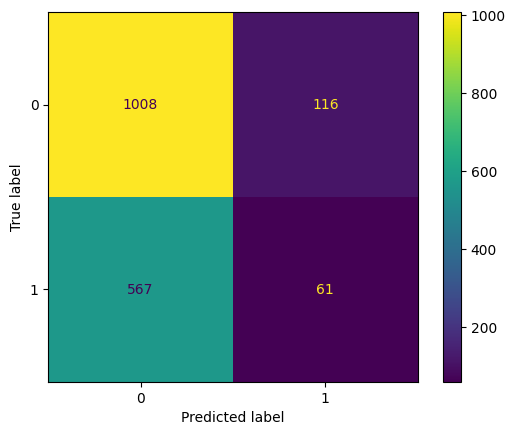

              precision    recall  f1-score   support

           0       0.64      0.90      0.75      1124
           1       0.34      0.10      0.15       628

    accuracy                           0.61      1752
   macro avg       0.49      0.50      0.45      1752
weighted avg       0.53      0.61      0.53      1752

0.64


In [ ]:
#entreno el arbol con los mejores parámetros
clf=DecisionTreeClassifier( max_depth=10,min_samples_leaf=0.01)
clf.fit(X_train, y_train)
pred = clf.predict(X_test)
conf_matrix = confusion_matrix(y_test, pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=clf.classes_)
disp.plot()
plt.show()
print(classification_report(y_test, pred))
TN, FP, FN, TP = confusion_matrix(y_test, pred).ravel()
VPN=TN/(TN+FN)
print(VPN)

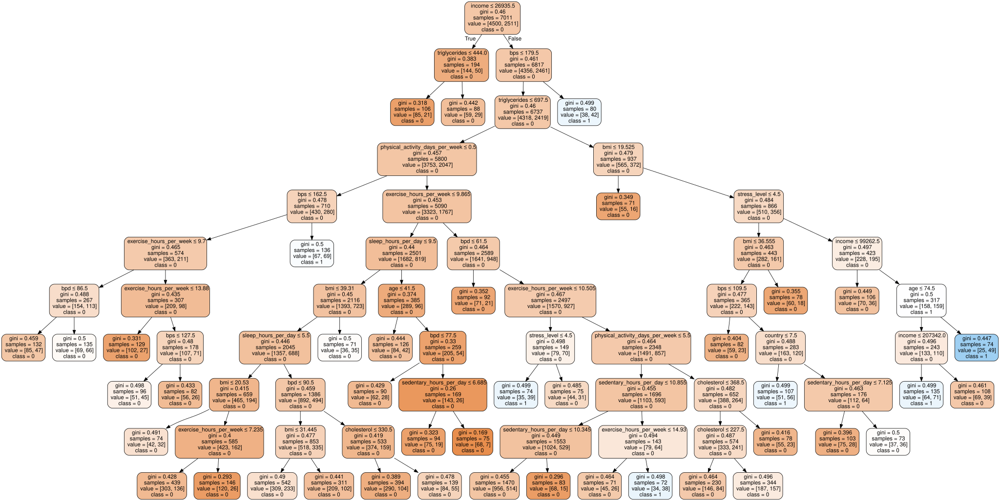

In [ ]:
# grafico el arbol de decisión entrenado
import graphviz
from sklearn import tree
dot_data = tree.export_graphviz(clf, out_file=None,
                                feature_names=feature_labels,
                                class_names=['0','1'],
                                filled=True, rounded=True,
                                special_characters=True

                                )
graph = graphviz.Source(dot_data)
graph

### Random Forest

In [ ]:
#target
y=df['heart_attack_risk']
#features
X=df.drop(columns='heart_attack_risk')
feature_labels=df.columns[~df.columns.isin(['heart_attack_risk'])]

In [ ]:
#importo paquetes
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import plot_tree
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay, f1_score, roc_curve, auc, RocCurveDisplay


In [ ]:
#divido en test y train
skf=StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for train_index, test_index in skf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

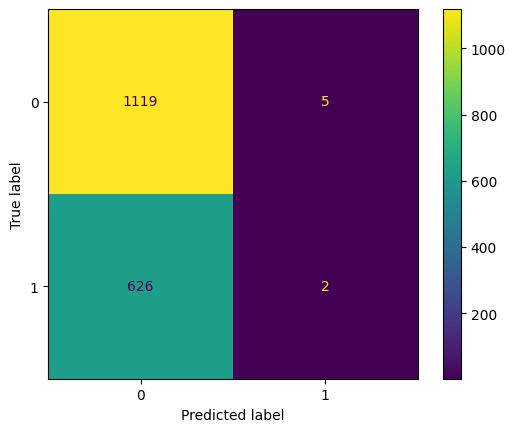

              precision    recall  f1-score   support

           0       0.64      1.00      0.78      1124
           1       0.29      0.00      0.01       628

    accuracy                           0.64      1752
   macro avg       0.46      0.50      0.39      1752
weighted avg       0.51      0.64      0.50      1752



In [ ]:
#creo el clasificador random forest
#uso el max deph del arbol de decisión
rf=RandomForestClassifier(n_estimators=100, random_state=42,max_depth=10)
rf.fit(X_train, y_train)
pred = rf.predict(X_test)
conf_matrix = confusion_matrix(y_test, pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=rf.classes_)
disp.plot()
plt.show()
print(classification_report(y_test, pred))


Parece ser que estos dos modelos de clasificación son bastante buenos para excluir la enfermedad cardíaca.

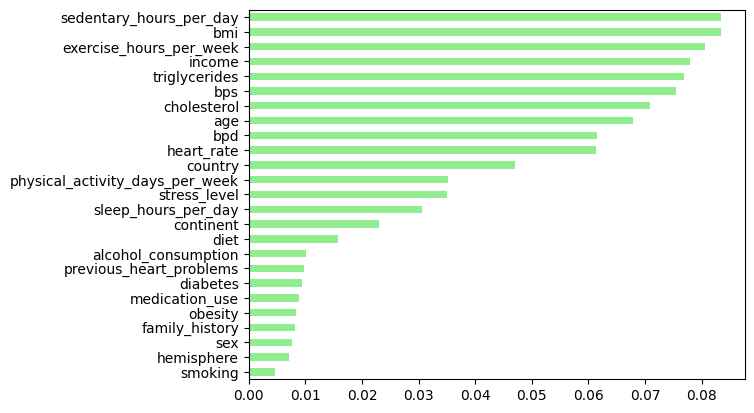

In [ ]:
#feature importance.
# Crear una Serie de pandas con la importancia de las características
importances_rf = pd.Series(rf.feature_importances_, index=X.columns)

# Ordenar importances_rf
sorted_importances_rf = importances_rf.sort_values()

# Hacer un gráfico de barras horizontal
sorted_importances_rf.plot(kind='barh', color='lightgreen')
plt.show()

Llama la atención que el sexo y el tabaquismo juege tengan poca importancia, así como tmabién el antecedentes de diabetes. Pero esto es consistente con el análisis exploratorio. ya que los diabeticos hacían mucho ejercicio y las demas variables estaban repartidas homogéneamente.
Además se observa que el BMI que se utiliza para estimar obesidad, tiene una importancia mucho mayor. Esto puede deberse a que es una variable continua

### XGBOOST





In [ ]:
import xgboost as xgb
from xgboost import plot_importance,plot_tree

In [ ]:
#target
y=df['heart_attack_risk']
#features
X=df.drop(columns='heart_attack_risk')
feature_labels=df.columns[~df.columns.isin(['heart_attack_risk'])]

In [ ]:
#divido en test y train
skf=StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for train_index, test_index in skf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

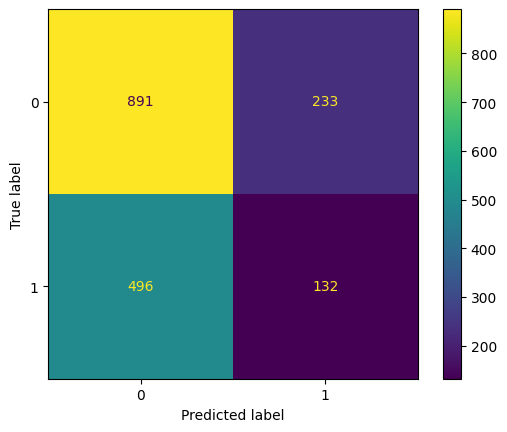

In [ ]:
# Instanciar un clasificador XGBoost
model = xgb.XGBClassifier(n_estimators=100, random_state=42)

# Entrenar el clasificador en el conjunto de entrenamiento
model.fit(X_train, y_train)

# Predecir las etiquetas del conjunto de prueba
pred = model.predict(X_test)

# Vemos la matriz de confusión
conf_matrix = confusion_matrix(y_test, pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=model.classes_)
disp.plot()
plt.show()

In [ ]:
print("Reporte de clasificación:\n", classification_report(y_test, pred))

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.64      0.80      0.71      1124
           1       0.35      0.19      0.25       628

    accuracy                           0.58      1752
   macro avg       0.49      0.50      0.48      1752
weighted avg       0.54      0.58      0.54      1752



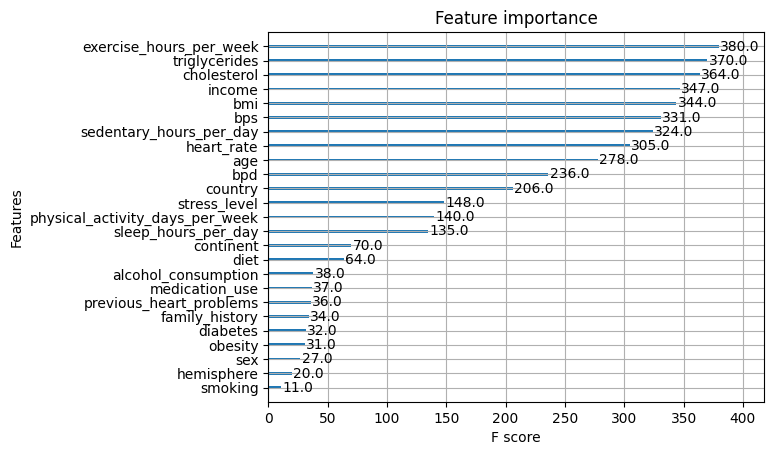

In [ ]:
plot_importance(model)
plt.show()

In [ ]:
#comparo los feature importance de los dos modelos
list(sorted_importances_rf.sort_values(ascending=False)[:9].index)

['sedentary_hours_per_day',
 'bmi',
 'exercise_hours_per_week',
 'income',
 'triglycerides',
 'bps',
 'cholesterol',
 'age',
 'bpd']

aquí se puede observar que la importancia de las variables es casi la misma en el Random fores y el XGBOOST.


## entrenamiento de random forest y XGboost con los 9 features más relevantes.


### feature engineering

In [ ]:
#Target
y=df['heart_attack_risk']
#features
feature_labels=list(sorted_importances_rf.sort_values(ascending=False)[:10].index)
X=df[feature_labels]

In [ ]:
X.head()

,sedentary_hours_per_day,bmi,exercise_hours_per_week,income,triglycerides,bps,cholesterol,age,bpd,heart_rate
0,6.62,31.25,4.17,261404,286,158,208,67,88,72
1,4.96,27.19,1.81,285768,235,165,389,21,93,98
2,9.46,28.18,2.08,235282,587,174,324,21,99,72
3,7.65,36.46,9.83,125640,378,163,383,84,100,73
4,1.51,21.81,5.80,160555,231,91,318,66,88,93


### XGBOOST

In [ ]:
### XGBOOST
#divido en test y train
skf=StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for train_index, test_index in skf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

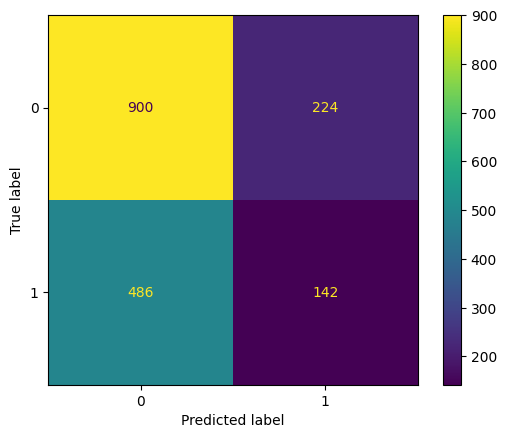

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.65      0.80      0.72      1124
           1       0.39      0.23      0.29       628

    accuracy                           0.59      1752
   macro avg       0.52      0.51      0.50      1752
weighted avg       0.56      0.59      0.56      1752



In [ ]:
# Instanciar un clasificador XGBoost
model = xgb.XGBClassifier(n_estimators=100, random_state=42)

# Entrenar el clasificador en el conjunto de entrenamiento
model.fit(X_train, y_train)

# Predecir las etiquetas del conjunto de prueba
pred = model.predict(X_test)

# Vemos la matriz de confusión
conf_matrix = confusion_matrix(y_test, pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=model.classes_)
disp.plot()
plt.show()
print("Reporte de clasificación:\n", classification_report(y_test, pred))

### Random Forest

In [ ]:
#divido en test y train
skf=StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for train_index, test_index in skf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

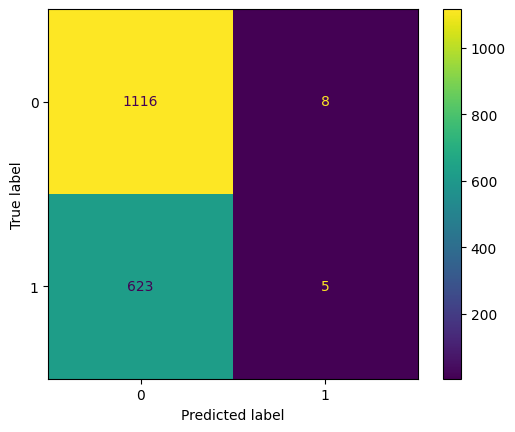

              precision    recall  f1-score   support

           0       0.64      0.99      0.78      1124
           1       0.38      0.01      0.02       628

    accuracy                           0.64      1752
   macro avg       0.51      0.50      0.40      1752
weighted avg       0.55      0.64      0.51      1752



In [ ]:
#creo el clasificador random forest
#uso el max deph del arbol de decisión
rf=RandomForestClassifier(n_estimators=100, random_state=42,max_depth=10)
rf.fit(X_train, y_train)
pred = rf.predict(X_test)
conf_matrix = confusion_matrix(y_test, pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=rf.classes_)
disp.plot()
plt.show()
print(classification_report(y_test, pred))

# Conclusión

La elaboración de modelos de clasificación para la predicción de enfermedad cardiovascular en base a un Dataframe sintético arrojó unas métricas pobres para la clasificación positiva. Sin embargo, el modelo mostró tener un score F1 moderado para la exclusión de infarto agudo de miocardio por lo que pudiera utilizarce esta herramienta para screening.

Siendo los mejores modelos los de random forest (según el F1), pudiendo restringir a la elaboración del modelo los features más relevantes, evitando asi el uso de 14 columnas.